In [67]:
import numpy as np 
import pandas as pd
import scanpy as sc
import seaborn as sns 
import matplotlib.pyplot as plt

In [2]:
def saveWithPickle(obj, PATH_out, filename="saveWithPickle"):
    import pickle
    with open(f'{PATH_out}/{filename}.pickle', 'wb') as handle:
        pickle.dump(obj, handle, protocol=pickle.HIGHEST_PROTOCOL)

def loadFromPickle(dir_pickle):
    import pickle
    with open(dir_pickle, 'rb') as handle:
        unserialized_pickle = pickle.load(handle)
    return unserialized_pickle

In [188]:
def markCellTypeToLeiden( dict_leiden_to_CellType, leiden, CellType ):
    if type(leiden)==str:
        dict_leiden_to_CellType[leiden] = CellType
    else:
        for l in leiden:
            dict_leiden_to_CellType[l] = CellType
    return dict_leiden_to_CellType

## Marker genes

In [ ]:
# B cells
    # Plasma cells
        # IGHA vs. IGHG
    # B cells
        # https://pmc.ncbi.nlm.nih.gov/articles/PMC6813733/#:~:text=Na%C3%AFve%20B%20Cells%20(N%3A%20Canonical,levels%20than%20in%20transitional%20cells.
        # GC: https://www.sciencedirect.com/science/article/pii/S1535610818303660?via%3Dihub


## Load data

In [116]:
# https://www.sc-best-practices.org/cellular_structure/annotation.html
marker_genes = {
    "CD14+ Mono": ["FCN1", "CD14"],
    "CD16+ Mono": ["TCF7L2", "FCGR3A", "LYN"],
    "ID2-hi myeloid prog": [
        "CD14",
        "ID2",
        "VCAN",
        "S100A9",
        "CLEC12A",
        "KLF4",
        "PLAUR",
    ],
    "cDC1": ["CLEC9A", "CADM1"],
    "cDC2": [
        "CST3",
        "COTL1",
        "LYZ",
        "DMXL2",
        "CLEC10A",
        "FCER1A",
    ],  # Note: DMXL2 should be negative
    "Normoblast": ["SLC4A1", "SLC25A37", "HBB", "HBA2", "HBA1", "TFRC"],
    "Erythroblast": ["MKI67", "HBA1", "HBB"],
    "Proerythroblast": [
        "CDK6",
        "SYNGR1",
        "HBM",
    ],  # Note HBM and GYPA are negative markers
    "NK": ["GNLY", "NKG7", "CD247", "GRIK4", "FCER1G", "TYROBP", "KLRG1", "FCGR3A"],
    "ILC": ["ID2", "PLCG2", "GNLY", "SYNE1"],
    "Lymph prog": [
        "VPREB1",
        "MME",
        "EBF1",
        "SSBP2",
        "BACH2",
        "CD79B",
        "IGHM",
        "PAX5",
        "PRKCE",
        "DNTT",
        "IGLL1",
    ],
    "Naive CD20+ B": ["MS4A1", "IL4R", "IGHD", "FCRL1", "IGHM"],
    "B1 B": [
        "MS4A1",
        "SSPN",
        "ITGB1",
        "EPHA4",
        "COL4A4",
        "PRDM1",
        "IRF4",
        "CD38",
        "XBP1",
        "PAX5",
        "BCL11A",
        "BLK",
        "IGHD",
        "IGHM",
        "ZNF215",
    ],  # Note IGHD and IGHM are negative markers
    "Transitional B": ["MME", "CD38", "CD24", "ACSM3", "MSI2"],
    "Plasma cells": ["MZB1", "HSP90B1", "FNDC3B", "PRDM1", "IGKC", "JCHAIN"],
    "Plasmablast": ["XBP1", "PRDM1", "PAX5"],  # Note PAX5 is a negative marker
    "CD4+ T activated": ["CD4", "IL7R", "TRBC2", "ITGB1"],
    "CD4+ T naive": ["CD4", "IL7R", "TRBC2", "CCR7"],
    "CD8+ T": ["CD8A", "CD8B", "GZMK", "GZMA", "CCL5", "GZMB", "GZMH", "GZMA"],
    "T activation": ["CD69", "CD38"],  # CD69 much better marker!
    "T naive": ["LEF1", "CCR7", "TCF7"],
    "pDC": ["GZMB", "IL3RA", "COBLL1", "TCF4"],
    "G/M prog": ["MPO", "BCL2", "KCNQ5", "CSF3R"],
    "HSC": ["NRIP1", "MECOM", "PROM1", "NKAIN2", "CD34"],
    "MK/E prog": [
        "ZNF385D",
        "ITGA2B",
        "RYR3",
        "PLCB1",
    ],  # Note PLCB1 is a negative marker
}

In [3]:
adata_chen = sc.read_h5ad('/node200data/18parkky/datasets/data/public/processed_data/Immunotherapy_CRC_Chen_et_al/2_cell_type_labeled_h5ad/Chen.MSI.preprocessed.NanoMnT.ManualAnnot.h5ad')
# adata_joanito = sc.read_h5ad('/node200data/18parkky/datasets/data/public/processed_data/Joanito_et_al/2_cell_type_labeled_h5ad/Joanito.preprocessed.NanoMnT.ManualAnnot.h5ad')

In [44]:
dict_Identifier_to_lvl_1_CellType = dict()
dict_Identifier_to_lvl_2_CellType = dict()

In [11]:
adata_chen_TME = adata_chen[adata_chen.obs['Manual_CellType_lvl_1']!='Tumor epithelial'].copy()
adata_chen_TME = adata_chen_TME.raw.to_adata()

In [12]:
sc.pp.normalize_total(adata_chen_TME)
sc.pp.log1p(adata_chen_TME)
sc.pp.highly_variable_genes(adata_chen_TME, n_top_genes=2000, batch_key="SampleID")

adata_chen_TME.raw = adata_chen_TME.copy()
adata_chen_TME = adata_chen_TME[:, adata_chen_TME.var.highly_variable]

In [13]:
sc.pp.scale(adata_chen_TME, max_value=10)
sc.tl.pca(adata_chen_TME, svd_solver="arpack")

/home/18parkky/anaconda3-2021.11/envs/sc/lib/python3.12/site-packages/scanpy/preprocessing/_scale.py:316: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [14]:
sc.pp.neighbors(adata_chen_TME, n_neighbors=15, n_pcs=40)
sc.tl.umap(adata_chen_TME, random_state=42)

In [15]:
sc.tl.leiden(adata_chen_TME, resolution=0.1, key_added='leiden_res_0.1')
sc.tl.leiden(adata_chen_TME, resolution=0.2, key_added='leiden_res_0.2')

In [9]:
sc.tl.rank_genes_groups(adata_chen_TME, groupby='leiden_res_0.1')

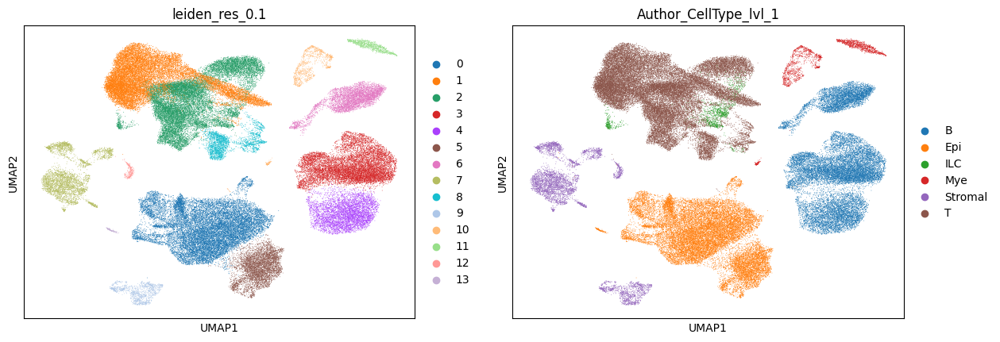

In [16]:
sc.pl.umap(adata_chen_TME, color=['leiden_res_0.1', 'Author_CellType_lvl_1'])

In [28]:
adata_chen_TME.write('/node200data/18parkky/datasets/data/public/processed_data/Immunotherapy_CRC_Chen_et_al/2_cell_type_labeled_h5ad/TME_annot_temp_files/Chen.MSI.preprocessed.NanoMnT.nonTumor.preAnnot.h5ad')

In [4]:
adata_chen_TME = sc.read_h5ad('/node200data/18parkky/datasets/data/public/processed_data/Immunotherapy_CRC_Chen_et_al/2_cell_type_labeled_h5ad/TME_annot_temp_files/Chen.MSI.preprocessed.NanoMnT.nonTumor.preAnnot.h5ad')

## B cells - leiden_res_0.1: 2,3,4

In [438]:
adata_chen_TME_B = adata_chen_TME[adata_chen_TME.obs['leiden_res_0.1'].isin(['3', '4', '6'])].copy()
adata_chen_TME_B = adata_chen_TME_B.raw.to_adata()

In [439]:
sc.pp.normalize_total(adata_chen_TME_B)
sc.pp.log1p(adata_chen_TME_B)
sc.pp.highly_variable_genes(adata_chen_TME_B, n_top_genes=2000, batch_key="SampleID")

adata_chen_TME_B.raw = adata_chen_TME_B.copy()
adata_chen_TME_B = adata_chen_TME_B[:, adata_chen_TME_B.var.highly_variable]

sc.pp.scale(adata_chen_TME_B, max_value=10)
sc.tl.pca(adata_chen_TME_B, svd_solver="arpack")

/home/18parkky/anaconda3-2021.11/envs/sc/lib/python3.12/site-packages/scanpy/preprocessing/_scale.py:316: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [440]:
sc.pp.neighbors(adata_chen_TME_B, n_neighbors=10, n_pcs=40)
sc.tl.umap(adata_chen_TME_B, random_state=42)

In [441]:
sc.tl.leiden(adata_chen_TME_B, resolution=0.2, key_added='sub1_leiden',)

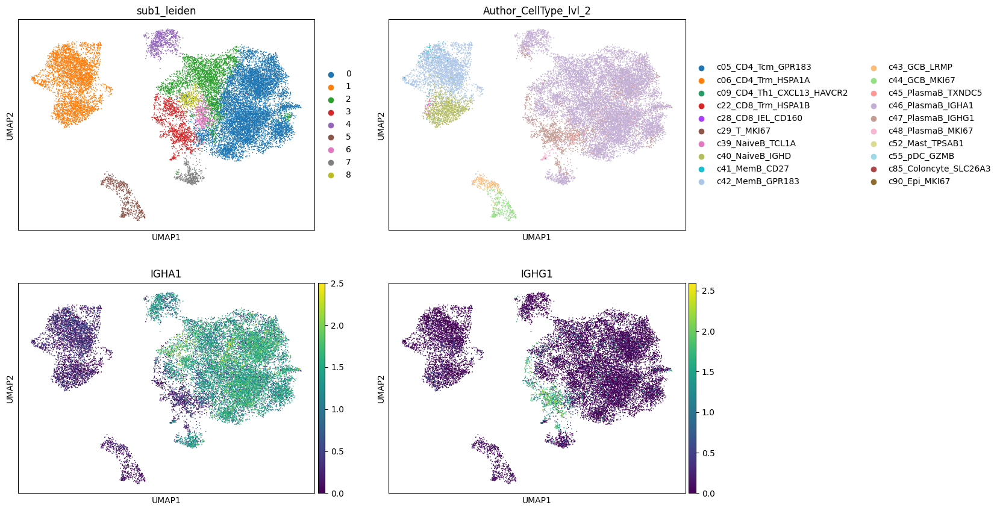

In [442]:
sc.pl.umap(adata_chen_TME_B, 
           color=['sub1_leiden', 'Author_CellType_lvl_2', 
                  'IGHA1', 'IGHG1'], 
           ncols=2, )

### Plasma cells

In [443]:
adata_chen_TME_B_Plasma = adata_chen_TME_B[~(adata_chen_TME_B.obs['sub1_leiden'].isin(['1', '5']))].copy()
adata_chen_TME_B_Plasma = adata_chen_TME_B_Plasma.raw.to_adata()

In [444]:
Plasma_markers = {
    'Plasma' : ['SDC1', 'MZB1', 'DERL3'],
}

In [445]:
sc.pp.normalize_total(adata_chen_TME_B_Plasma)
sc.pp.log1p(adata_chen_TME_B_Plasma)
sc.pp.highly_variable_genes(adata_chen_TME_B_Plasma, n_top_genes=2000)

adata_chen_TME_B_Plasma.raw = adata_chen_TME_B_Plasma.copy()
adata_chen_TME_B_Plasma = adata_chen_TME_B_Plasma[:, adata_chen_TME_B_Plasma.var.highly_variable]

sc.pp.scale(adata_chen_TME_B_Plasma, max_value=10)
sc.tl.pca(adata_chen_TME_B_Plasma, svd_solver="arpack")

sc.pp.neighbors(adata_chen_TME_B_Plasma, n_neighbors=10, n_pcs=40)
sc.tl.umap(adata_chen_TME_B_Plasma, random_state=42)

/home/18parkky/anaconda3-2021.11/envs/sc/lib/python3.12/site-packages/scanpy/preprocessing/_scale.py:316: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [446]:
sc.tl.leiden(adata_chen_TME_B_Plasma, resolution=0.5, key_added='sub2_leiden')

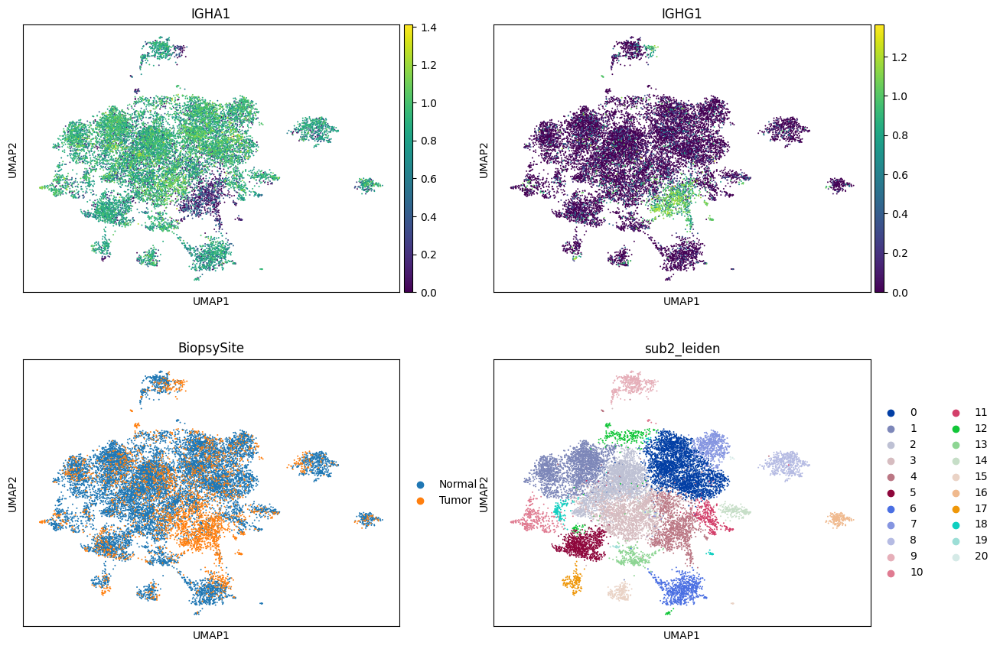

In [447]:
sc.pl.umap(adata_chen_TME_B_Plasma, color=['IGHA1', 'IGHG1', 'BiopsySite', 'sub2_leiden',], ncols=2)

In [448]:
sc.tl.rank_genes_groups(adata_chen_TME_B_Plasma, groupby='sub2_leiden', method='wilcoxon')

/home/18parkky/anaconda3-2021.11/envs/sc/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:435: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/home/18parkky/anaconda3-2021.11/envs/sc/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:437: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
/home/18parkky/anaconda3-2021.11/envs/sc/lib/python3.12/site-packages/scanpy/tools/_rank_genes_grou

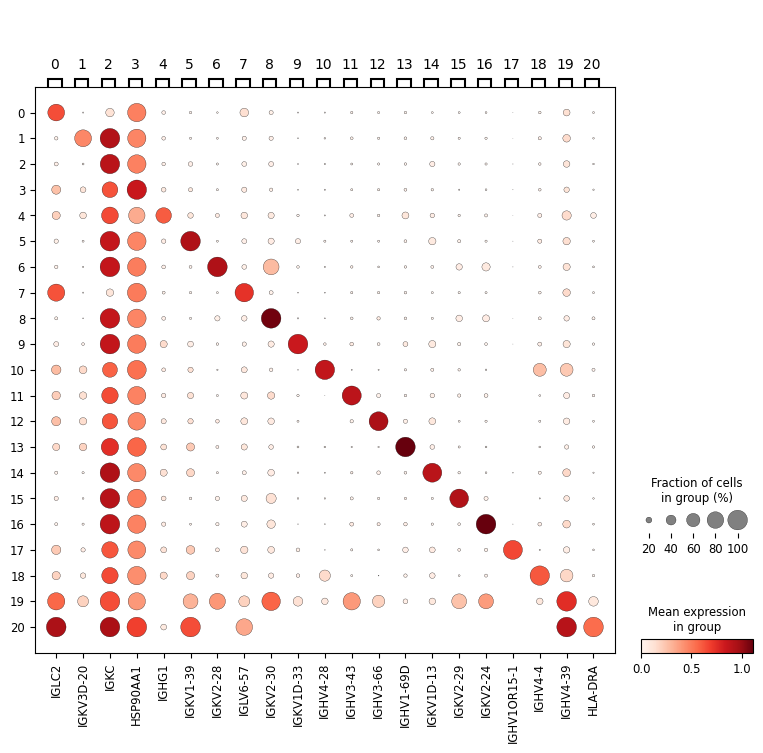

In [449]:
sc.pl.rank_genes_groups_dotplot(adata_chen_TME_B_Plasma, n_genes=1, groupby='sub2_leiden', dendrogram=False)

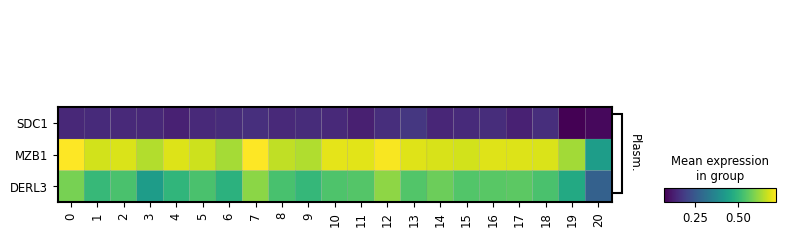

In [450]:
sc.pl.matrixplot(adata_chen_TME_B_Plasma, var_names=Plasma_markers, groupby='sub2_leiden', swap_axes=True)

#### leiden 4 → Mixture of IGHG+ and other plasmas

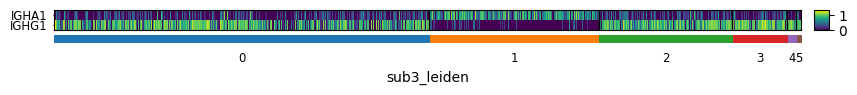

In [451]:
adata_chen_TME_B_Plasma_l4 = adata_chen_TME_B_Plasma[adata_chen_TME_B_Plasma.obs['sub2_leiden']=='4'].copy()
# adata_chen_TME_B_Plasma_l4 = adata_chen_TME_B_Plasma_l4.raw.to_adata()
sc.tl.leiden(adata_chen_TME_B_Plasma_l4, resolution=0.3, key_added='sub3_leiden')
sc.pl.heatmap(adata_chen_TME_B_Plasma_l4, var_names=['IGHA1', 'IGHG1',], groupby='sub3_leiden', swap_axes=True)

In [452]:
set(adata_chen_TME_B_Plasma_l4.obs['sub3_leiden'])

{'0', '1', '2', '3', '4', '5'}

In [453]:
for tup in adata_chen_TME_B_Plasma_l4[adata_chen_TME_B_Plasma_l4.obs['sub3_leiden'].isin(['0', '2', '3', '4', '5'])].obs.itertuples():
    dict_Identifier_to_lvl_1_CellType[tup.Identifier] = 'Plasma'
    dict_Identifier_to_lvl_2_CellType[tup.Identifier] = 'IGHG+ Plasma'
    
for tup in adata_chen_TME_B_Plasma_l4[adata_chen_TME_B_Plasma_l4.obs['sub3_leiden'].isin(['1'])].obs.itertuples():
    dict_Identifier_to_lvl_1_CellType[tup.Identifier] = 'Plasma'
    dict_Identifier_to_lvl_2_CellType[tup.Identifier] = 'IGHA+ Plasma'

#### Label results

In [454]:
for tup in adata_chen_TME_B_Plasma[adata_chen_TME_B_Plasma.obs['sub2_leiden']!='4'].obs.itertuples():
    dict_Identifier_to_lvl_1_CellType[tup.Identifier] = 'Plasma'
    dict_Identifier_to_lvl_2_CellType[tup.Identifier] = 'IGHA+ Plasma'

In [455]:
adata_chen_TME_B_Plasma.obs['Manual_CellType_lvl_1'] = [ dict_Identifier_to_lvl_1_CellType[Identifier] for Identifier in adata_chen_TME_B_Plasma.obs['Identifier'] ]
adata_chen_TME_B_Plasma.obs['Manual_CellType_lvl_2'] = [ dict_Identifier_to_lvl_2_CellType[Identifier] for Identifier in adata_chen_TME_B_Plasma.obs['Identifier'] ]

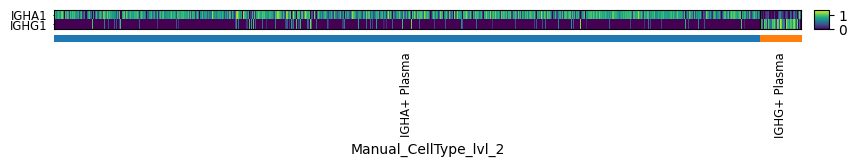

In [456]:
sc.pl.heatmap(adata_chen_TME_B_Plasma, var_names=['IGHA1', 'IGHG1'], groupby='Manual_CellType_lvl_2', swap_axes=True,)

### B cells (exclude variable IG genes)

In [457]:
adata_chen_TME_B_B = adata_chen_TME_B[(adata_chen_TME_B.obs['sub1_leiden'].isin(['1', '5']))].copy()
adata_chen_TME_B_B = adata_chen_TME_B_B.raw.to_adata()

IGK_gene = list()
for gene in adata_chen_TME_B_B.var.index:
    if ('IGKV' == gene[:4]) or ('IGLV' == gene[:4]) or ('IGHV' == gene[:4]):
        IGK_gene.append(gene)
        
adata_chen_TME_B_B = adata_chen_TME_B_B[:, ~(adata_chen_TME_B_B.var.index.isin( IGK_gene ))]

In [458]:
temp = list()
for SampleID, edf in adata_chen_TME_B_B.obs.groupby('SampleID'):
    if len(edf) <= 1:
        temp.append( SampleID )
        dict_Identifier_to_lvl_1_CellType[edf.iloc[0].Identifier] = 'B'
        dict_Identifier_to_lvl_2_CellType[edf.iloc[0].Identifier] = 'N/A'

adata_chen_TME_B_B = adata_chen_TME_B_B[~(adata_chen_TME_B_B.obs['SampleID'].isin(temp))].copy()

/tmp/ipykernel_209065/2902770684.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for SampleID, edf in adata_chen_TME_B_B.obs.groupby('SampleID'):


In [459]:
sc.pp.normalize_total(adata_chen_TME_B_B)
sc.pp.log1p(adata_chen_TME_B_B)
sc.pp.highly_variable_genes(adata_chen_TME_B_B, n_top_genes=2000, batch_key='SampleID')

adata_chen_TME_B_B.raw = adata_chen_TME_B_B.copy()
adata_chen_TME_B_B = adata_chen_TME_B_B[:, adata_chen_TME_B_B.var.highly_variable]

sc.pp.scale(adata_chen_TME_B_B, max_value=10)
sc.tl.pca(adata_chen_TME_B_B, svd_solver="arpack")

sc.pp.neighbors(adata_chen_TME_B_B, n_neighbors=10, n_pcs=40)
sc.tl.umap(adata_chen_TME_B_B, random_state=42)

/home/18parkky/anaconda3-2021.11/envs/sc/lib/python3.12/site-packages/scanpy/preprocessing/_highly_variable_genes.py:305: RuntimeWarning: invalid value encountered in log
  dispersion = np.log(dispersion)
/home/18parkky/anaconda3-2021.11/envs/sc/lib/python3.12/site-packages/scanpy/preprocessing/_highly_variable_genes.py:412: UserWarning: `n_top_genes` > number of normalized dispersions, returning all genes with normalized dispersions.
  warnings.warn(msg, UserWarning)
/home/18parkky/anaconda3-2021.11/envs/sc/lib/python3.12/site-packages/scanpy/preprocessing/_scale.py:316: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [460]:
sc.tl.leiden(adata_chen_TME_B_B, resolution=0.2, key_added='sub2_leiden')

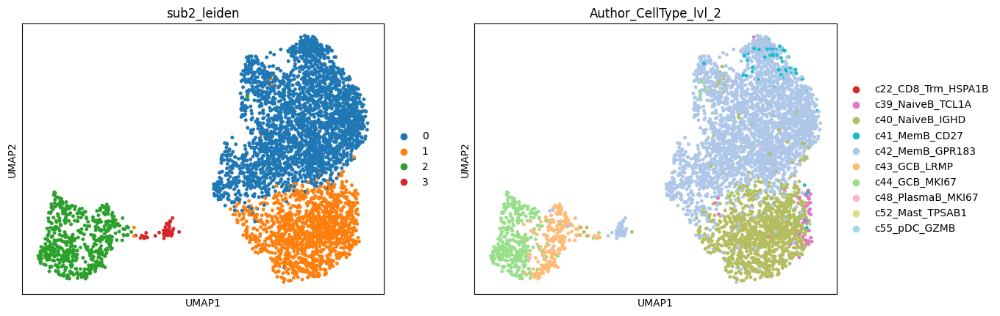

In [461]:
sc.pl.umap(adata_chen_TME_B_B, color=['sub2_leiden', 'Author_CellType_lvl_2', ], s=50)

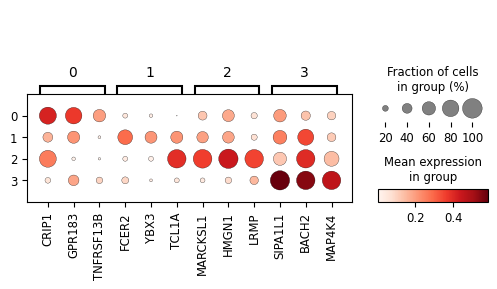

In [462]:
sc.tl.rank_genes_groups(adata_chen_TME_B_B, groupby='sub2_leiden', method='logreg')
sc.pl.rank_genes_groups_dotplot(adata_chen_TME_B_B, n_genes=3, groupby='sub2_leiden', dendrogram=False)

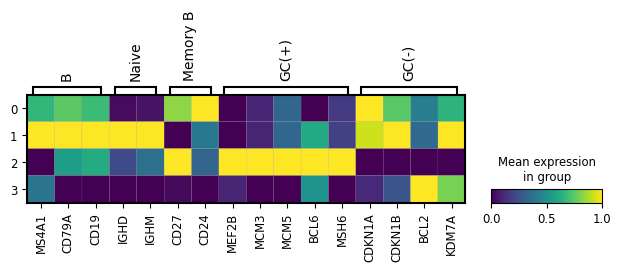

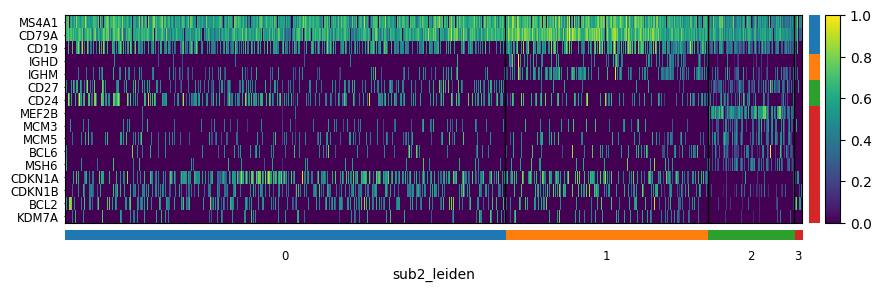

In [463]:
# https://pmc.ncbi.nlm.nih.gov/articles/PMC6813733/#:~:text=Na%C3%AFve%20B%20Cells%20(N%3A%20Canonical,levels%20than%20in%20transitional%20cells.
    # Transitional B Cells (T; Canonical Phenotype: CD19+, IgDlo/+, CD27–, CD24++, CD38++)
    # Naïve B Cells (N: Canonical Phenotype: CD19+, IgD+, CD27–, CD38+/–, CD24+/–)
    # Memory B Cells (M; Canonical Phenotype: CD19+, CD27+, CD38+/–, CD24+/–)

# GC: https://www.sciencedirect.com/science/article/pii/S1535610818303660?via%3Dihub

B_markers = { 'B' : ['MS4A1', 'CD79A', 'CD19'], 
            'Naive' : ["IGHD", 'IGHM', ],
            'Memory B' : ['CD27', 'CD24'], 
            # 'Activated B' : ['IGHA1', 'IGHG1', ],
            'GC(+)' : ['MEF2B', 'MCM3', 'MCM5', 'BCL6', 'MSH6', ], 
            'GC(-)' : ['CDKN1A', 'CDKN1B', 'BCL2', 'KDM7A'],  # BCL2 is negative marker
}


sc.pl.matrixplot(adata_chen_TME_B_B, var_names=B_markers, 
              groupby='sub2_leiden', 
              standard_scale='var',
              )
sc.pl.heatmap(adata_chen_TME_B_B, var_names=B_markers, 
              groupby='sub2_leiden', 
              standard_scale='var', swap_axes=True,
              )

#### leiden 0 → Memory B

In [464]:
for tup in adata_chen_TME_B_B.obs.itertuples():
    if tup.sub2_leiden in ['0']:
        dict_Identifier_to_lvl_2_CellType[tup.Identifier] = 'Memory B'

#### leiden 1 → Naive B

In [465]:
for tup in adata_chen_TME_B_B.obs.itertuples():
    if tup.sub2_leiden in ['1',]:
        dict_Identifier_to_lvl_2_CellType[tup.Identifier] = 'Naive B'

#### leiden 2 → GC B

In [466]:
for tup in adata_chen_TME_B_B.obs.itertuples():
    if tup.sub2_leiden in ['2',]:
        dict_Identifier_to_lvl_2_CellType[tup.Identifier] = 'GC B'

#### leiden 3 → N/A

In [467]:
for tup in adata_chen_TME_B_B.obs.itertuples():
    if tup.sub2_leiden in ['3',]:
        dict_Identifier_to_lvl_2_CellType[tup.Identifier] = 'N/A'

#### Label results

In [468]:
for Identifier in adata_chen_TME_B_B.obs['Identifier']:
    dict_Identifier_to_lvl_1_CellType[Identifier] = 'B'

In [469]:
adata_chen_TME_B_B.obs['Manual_CellType_lvl_1'] = [ dict_Identifier_to_lvl_1_CellType[Identifier] for Identifier in adata_chen_TME_B_B.obs['Identifier'] ]
adata_chen_TME_B_B.obs['Manual_CellType_lvl_2'] = [ dict_Identifier_to_lvl_2_CellType[Identifier] for Identifier in adata_chen_TME_B_B.obs['Identifier'] ]

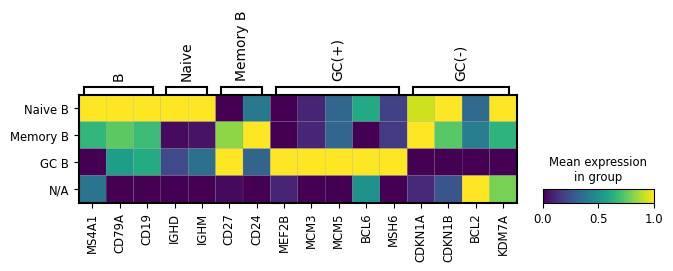

In [470]:
sc.pl.matrixplot(adata_chen_TME_B_B, groupby='Manual_CellType_lvl_2', var_names=B_markers, standard_scale='var', 
                 categories_order=['Naive B', 'Memory B', 'GC B', 'N/A'] )

### Overview of B cell results

In [471]:
adata_chen_TME_B.obs[~(adata_chen_TME_B.obs['Identifier'].isin(list(dict_Identifier_to_lvl_1_CellType.keys())))]

,doublet_score,predicted_doublet,SampleID,PatientID,BiopsySite,Accession,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,...,n_genes,AvgSTRDiff,StdSTRDiff,NumSTRLoci,MSI,Response,Manual_CellType_lvl_1,leiden_res_0.1,leiden_res_0.2,sub1_leiden


In [472]:
adata_chen_TME_B.obs['Manual_CellType_lvl_1'] = [ dict_Identifier_to_lvl_1_CellType[Identifier] for Identifier in adata_chen_TME_B.obs['Identifier'] ]
adata_chen_TME_B.obs['Manual_CellType_lvl_2'] = [ dict_Identifier_to_lvl_2_CellType[Identifier] for Identifier in adata_chen_TME_B.obs['Identifier'] ]

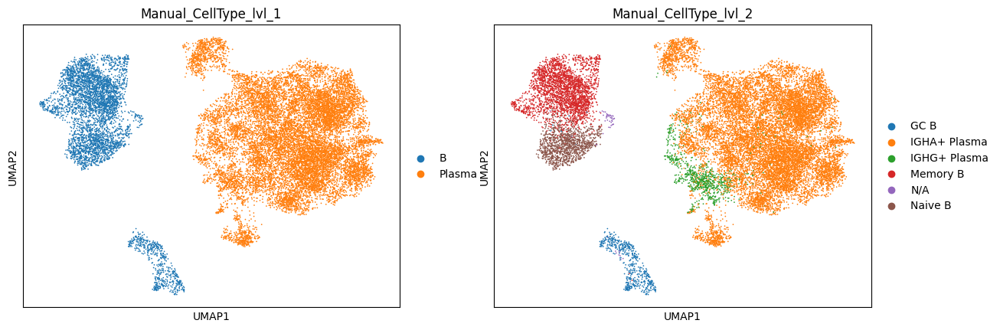

In [473]:
sc.pl.umap(adata_chen_TME_B, color=['Manual_CellType_lvl_1', 'Manual_CellType_lvl_2'])

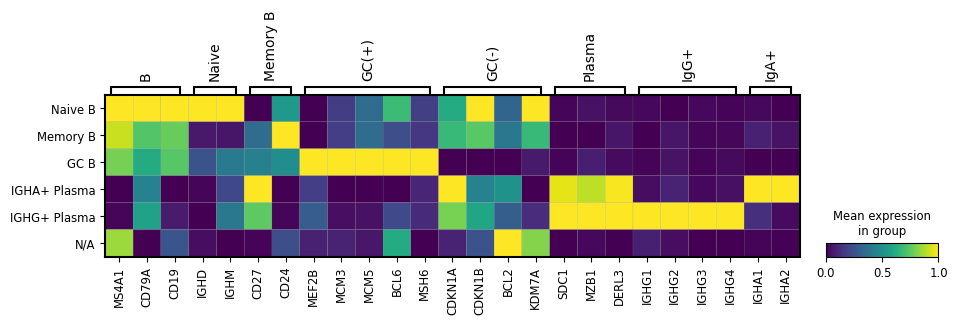

In [474]:
B_markers_total = dict()
for k,v in B_markers.items(): B_markers_total[k] = v
for k,v in Plasma_markers.items(): B_markers_total[k] = v
B_markers_total['IgG+'] = [ 'IGHG1', 'IGHG2', 'IGHG3', 'IGHG4' ]
B_markers_total['IgA+'] = [ 'IGHA1', 'IGHA2',  ]

sc.pl.matrixplot(adata_chen_TME_B, var_names=B_markers_total, groupby='Manual_CellType_lvl_2', standard_scale='var', 
                 categories_order=['Naive B', 'Memory B', 'GC B', 'IGHA+ Plasma', 'IGHG+ Plasma', 'N/A'])

## T&NK cells - leiden_res_0.1: 0,1,6,11

In [5]:
adata_chen_TME_T_NK = adata_chen_TME[adata_chen_TME.obs['leiden_res_0.1'].isin(['1', '2', '8'])].copy()
adata_chen_TME_T_NK = adata_chen_TME_T_NK.raw.to_adata()

In [6]:
sc.pp.normalize_total(adata_chen_TME_T_NK)
sc.pp.log1p(adata_chen_TME_T_NK)
sc.pp.highly_variable_genes(adata_chen_TME_T_NK, n_top_genes=2000, batch_key='SampleID')

adata_chen_TME_T_NK.raw = adata_chen_TME_T_NK.copy()
adata_chen_TME_T_NK = adata_chen_TME_T_NK[:, adata_chen_TME_T_NK.var.highly_variable]
# adata_chen_TME_T_NK = adata_chen_TME_T_NK[:, adata_chen_TME_T_NK.var.index.isin( Smillie_marker[Smillie_marker['ident'].isin(dict_Name_to_CellSubsets['T.Tcells'])]['gene'] )]

sc.pp.scale(adata_chen_TME_T_NK, max_value=10)
sc.tl.pca(adata_chen_TME_T_NK, svd_solver="arpack")

sc.pp.neighbors(adata_chen_TME_T_NK, n_neighbors=10, n_pcs=40)
sc.tl.umap(adata_chen_TME_T_NK, random_state=42)

/home/18parkky/anaconda3-2021.11/envs/sc/lib/python3.12/site-packages/scanpy/preprocessing/_scale.py:316: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
2025-03-15 15:01:25.577486: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-03-15 15:01:25.609087: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-03-15 15:01:26.158730: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-03-15 15:01:26.357881: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-03-15 

In [7]:
sc.tl.leiden(adata_chen_TME_T_NK, resolution=0.2, key_added='sub1_leiden')

/tmp/ipykernel_119347/4187241760.py:1: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata_chen_TME_T_NK, resolution=0.2, key_added='sub1_leiden')


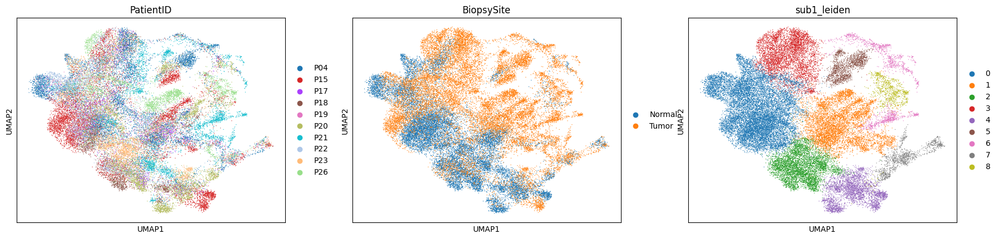

In [8]:
sc.pl.umap(adata_chen_TME_T_NK, color=['PatientID', 'BiopsySite', 'sub1_leiden'])

<Axes: xlabel='sub1_leiden', ylabel='count'>

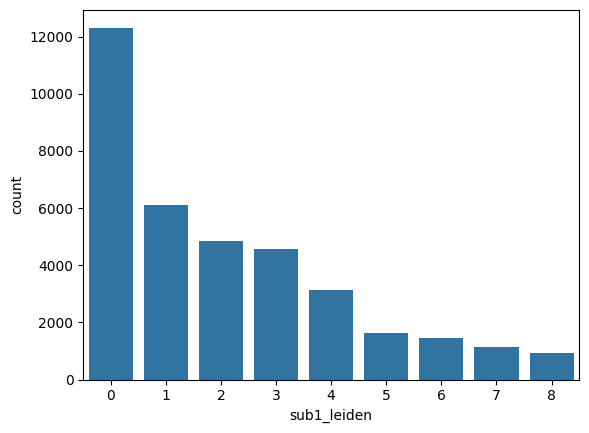

In [479]:
sns.countplot(x=adata_chen_TME_T_NK.obs['sub1_leiden'])

In [9]:
T_markers = {
    'T' : ['CD3D', 'CD3E', ],
    'Naive T(+)' : ['PTPRC', 'IL7R', 'CCR7', 'FOXP1', 'SELL',],
    'Naive T(-)' : ['IFNG'],
    'CD4 T' : ['TRAC', 'CD4', 'FOXP3'],
    'CD8 T' : ['CD8A', 'CD8B', 'GZMK'],
    'NK' : ['NCAM1', 'KLRD1', 'NKG7'],
    'GD T' : ['TRDV1', 'TRDV2', 'TRDV3'],
}

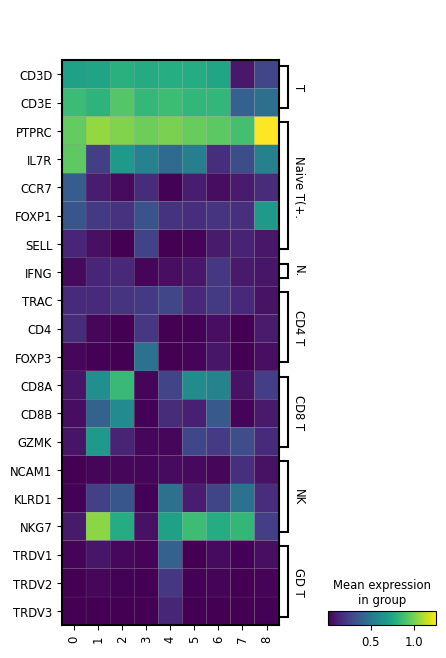

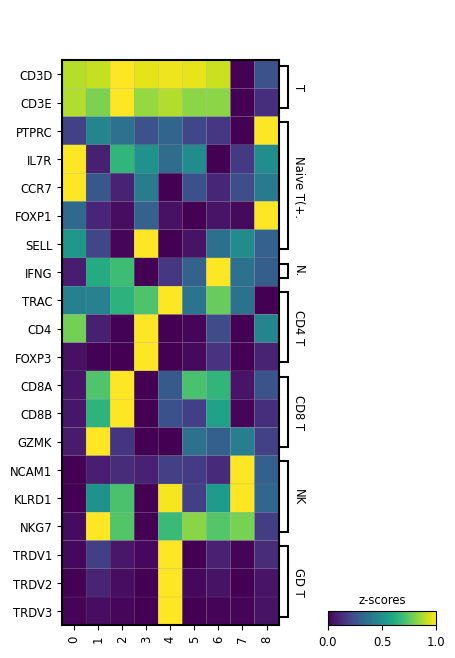

In [10]:
sc.pl.matrixplot(adata_chen_TME_T_NK, var_names=T_markers, groupby='sub1_leiden', swap_axes=True,)
sc.pl.matrixplot(adata_chen_TME_T_NK, var_names=T_markers, groupby='sub1_leiden', swap_axes=True, standard_scale='var', colorbar_title='z-scores')

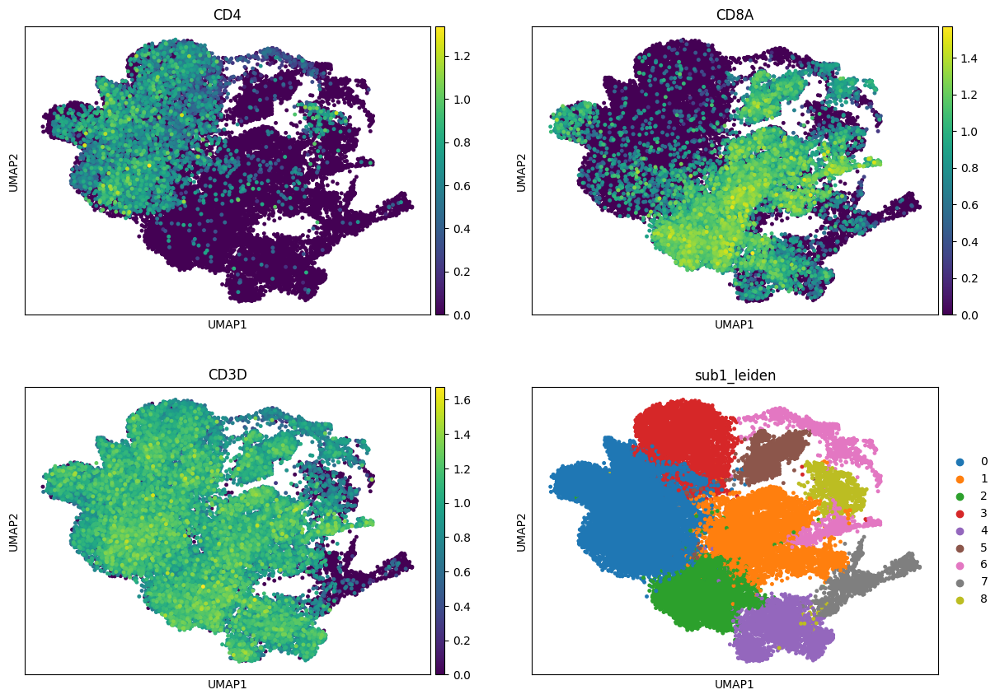

In [114]:
sc.pl.umap(adata_chen_TME_T_NK, color=['CD4', 'CD8A', 'CD3D', 'sub1_leiden'], ncols=2, s=50)

In [ ]:
def addMeanExpression( adata, genes, name ):
    if name == str():
        print(f'Invalid score name')
        return 
    
    try:
        adata_raw = adata.raw.to_adata()
    except AttributeError:
        adata_raw = adata

    gene_indices = [ idx for idx, gene in enumerate(adata_raw.var.index) if gene in genes ]
    
    dict_Identifier_to_MeanExpression = dict()
    for idx, tup in enumerate(adata_raw.obs.itertuples()):
        expression = [ adata_raw.X[idx].toarray().ravel()[gene_idx] for gene_idx in gene_indices ] 
        dict_Identifier_to_MeanExpression[tup.Identifier] = np.mean(expression)
    
    adata.obs[name] = [ dict_Identifier_to_MeanExpression[Identifier] for Identifier in adata.obs['Identifier'] ]
    return

In [159]:
addMeanExpression(adata_chen_TME_T_NK, ['CD8A', 'CD8B'], 'Mean_CD8' )
addMeanExpression(adata_chen_TME_T_NK, ['CD4',], 'Mean_CD4' )

### leiden 0 → Mixture of CD4 and CD8 (very minimal)

In [24]:
adata_chen_TME_T_NK_l0 = adata_chen_TME_T_NK[adata_chen_TME_T_NK.obs['sub1_leiden']=='0'].copy()
adata_chen_TME_T_NK_l0 = adata_chen_TME_T_NK_l0.raw.to_adata()

In [25]:
sc.pp.normalize_total(adata_chen_TME_T_NK_l0)
sc.pp.log1p(adata_chen_TME_T_NK_l0)
sc.pp.highly_variable_genes(adata_chen_TME_T_NK_l0, n_top_genes=2000, batch_key='SampleID')

adata_chen_TME_T_NK_l0.raw = adata_chen_TME_T_NK_l0.copy()
adata_chen_TME_T_NK_l0 = adata_chen_TME_T_NK_l0[:, adata_chen_TME_T_NK_l0.var.highly_variable]

sc.pp.scale(adata_chen_TME_T_NK_l0, max_value=10)
sc.tl.pca(adata_chen_TME_T_NK_l0, svd_solver="arpack")

sc.pp.neighbors(adata_chen_TME_T_NK_l0, n_neighbors=10, n_pcs=40)
sc.tl.umap(adata_chen_TME_T_NK_l0, random_state=42)

sc.tl.leiden(adata_chen_TME_T_NK_l0, resolution=0.2, key_added='sub2_leiden')

/home/18parkky/anaconda3-2021.11/envs/sc/lib/python3.12/site-packages/scanpy/preprocessing/_scale.py:316: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [164]:
sc.tl.score_genes(adata_chen_TME_T_NK_l0, ['CD8A', 'CD8B'], score_name='CD8_score')
sc.tl.score_genes(adata_chen_TME_T_NK_l0, ['CD4'], score_name='CD4_score')
sc.tl.score_genes(adata_chen_TME_T_NK_l0, ['CD3D', 'CD3E'], score_name='CD3_score')

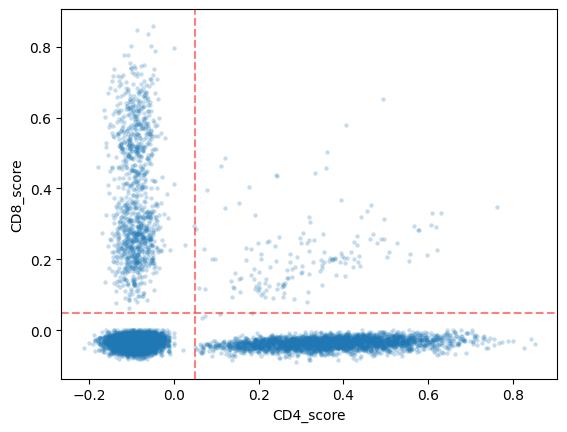

In [165]:
sns.scatterplot(data=adata_chen_TME_T_NK_l0.obs ,x="CD4_score", y='CD8_score', s=10, **{'linewidth':0}, alpha=0.25,)
plt.axhline(0.05, ls='--', color='red', alpha=0.5,)
plt.axvline(0.05, ls='--', color='red', alpha=0.5,)

# score_threshold = 0.05

# l = list()
# for tup in adata_chen_TME_T_NK_l0_other.obs.itertuples():
#     if (tup.CD4_score >= score_threshold) and (tup.CD8_score < score_threshold) : l.append( 'CD4+ T' )
#     elif (tup.CD8_score >= score_threshold) and (tup.CD4_score < score_threshold) : l.append( 'CD8+ T' )
#     elif (tup.CD8_score >= score_threshold) and (tup.CD4_score >= score_threshold) : l.append( 'DP T' )
#     else: l.append( 'DN T' )

# adata_chen_TME_T_NK_l0_other.obs['scatter_annot'] = l
# sc.pl.umap(adata_chen_TME_T_NK_l0_other, color=['total_counts'], s=50)

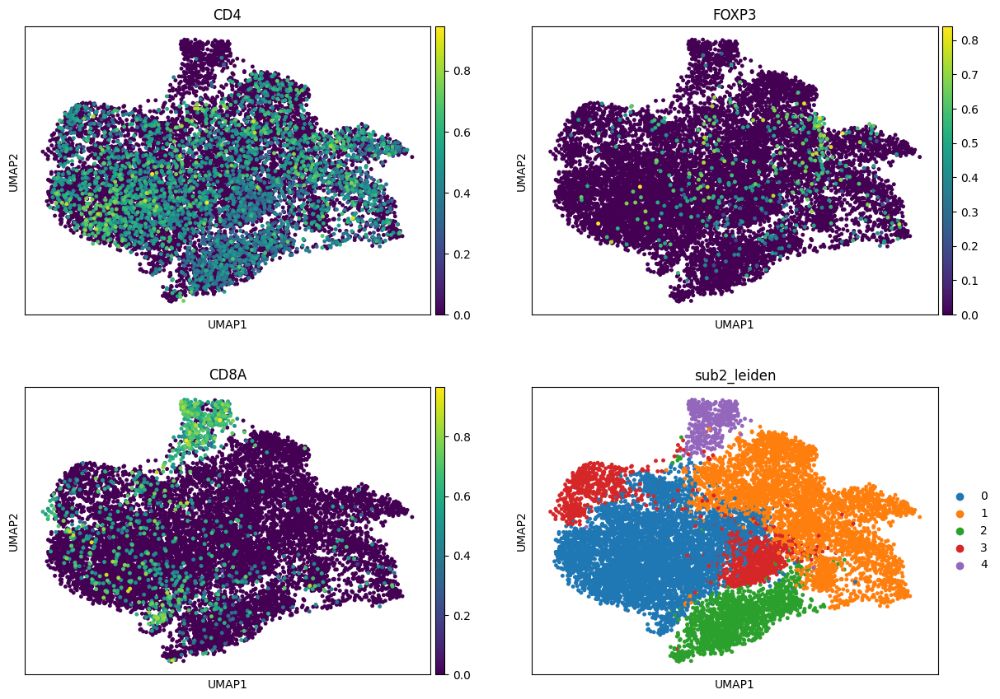

In [26]:
sc.pl.umap(adata_chen_TME_T_NK_l0, color=['CD4', 'FOXP3', 'CD8A', 'sub2_leiden'], ncols=2, s=50)

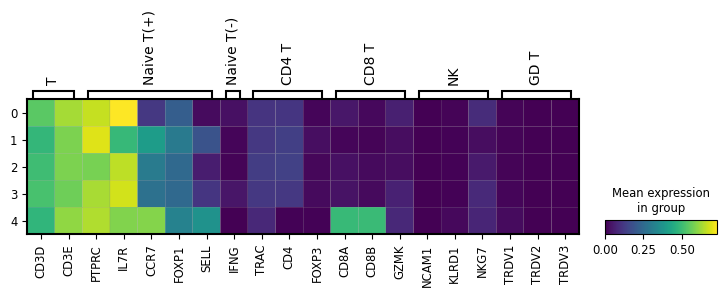

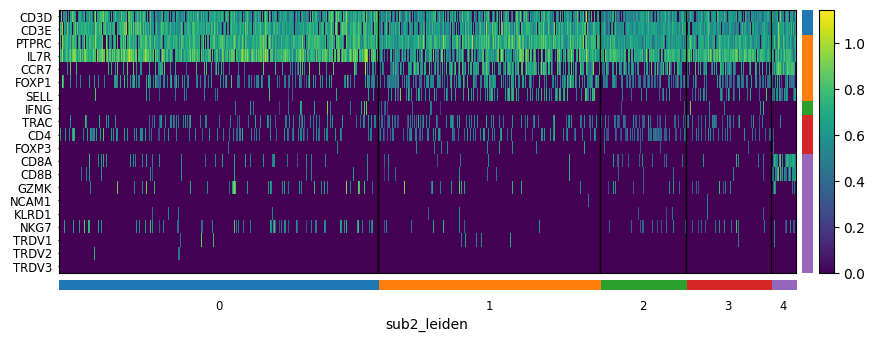

In [485]:
# sc.pl.matrixplot(adata_chen_TME_T_NK_l0, var_names=T_markers, groupby='sub2_leiden', standard_scale='var')
sc.pl.matrixplot(adata_chen_TME_T_NK_l0, var_names=T_markers, groupby='sub2_leiden', )
sc.pl.heatmap( adata_chen_TME_T_NK_l0, groupby='sub2_leiden', var_names=T_markers, swap_axes=True, )

#### sub2_leiden 4 → CD8+ T

In [ ]:
# for tup in adata_chen_TME_T_NK_l0[adata_chen_TME_T_NK_l0.obs['sub2_leiden'].isin(['0', '1', '2', '3'])].obs.itertuples():
#     dict_Identifier_to_lvl_1_CellType[tup.Identifier] = 'T'
#     dict_Identifier_to_lvl_2_CellType[tup.Identifier] = 'CD4+ T'

In [486]:
for tup in adata_chen_TME_T_NK_l0[adata_chen_TME_T_NK_l0.obs['sub2_leiden'].isin(['4'])].obs.itertuples():
    dict_Identifier_to_lvl_1_CellType[tup.Identifier] = 'T'
    dict_Identifier_to_lvl_2_CellType[tup.Identifier] = 'CD8+ T'

#### sub2_leiden 0,1,2,3 → Mixture of CD8+ and CD4+ T

In [29]:
adata_chen_TME_T_NK_l0_other = adata_chen_TME_T_NK_l0[adata_chen_TME_T_NK_l0.obs['sub2_leiden']!='4'].copy()
adata_chen_TME_T_NK_l0_other = adata_chen_TME_T_NK_l0_other.raw.to_adata()

sc.pp.normalize_total(adata_chen_TME_T_NK_l0_other)
sc.pp.log1p(adata_chen_TME_T_NK_l0_other)
sc.pp.highly_variable_genes(adata_chen_TME_T_NK_l0_other, n_top_genes=2000, batch_key='SampleID')

adata_chen_TME_T_NK_l0_other.raw = adata_chen_TME_T_NK_l0_other.copy()
adata_chen_TME_T_NK_l0_other = adata_chen_TME_T_NK_l0_other[:, adata_chen_TME_T_NK_l0_other.var.highly_variable]

sc.pp.scale(adata_chen_TME_T_NK_l0_other, max_value=10)
sc.tl.pca(adata_chen_TME_T_NK_l0_other, svd_solver="arpack")

sc.pp.neighbors(adata_chen_TME_T_NK_l0_other, n_neighbors=10, n_pcs=40)
sc.tl.umap(adata_chen_TME_T_NK_l0_other, random_state=42)

sc.tl.leiden(adata_chen_TME_T_NK_l0_other, resolution=0.2, key_added='sub3_leiden')

/home/18parkky/anaconda3-2021.11/envs/sc/lib/python3.12/site-packages/scanpy/preprocessing/_scale.py:316: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [48]:
sc.tl.score_genes(adata_chen_TME_T_NK_l0_other, ['CD8A', 'CD8B'], score_name='CD8_score')
sc.tl.score_genes(adata_chen_TME_T_NK_l0_other, ['CD4'], score_name='CD4_score')
sc.tl.score_genes(adata_chen_TME_T_NK_l0_other, ['CD3D', 'CD3E'], score_name='CD3_score')

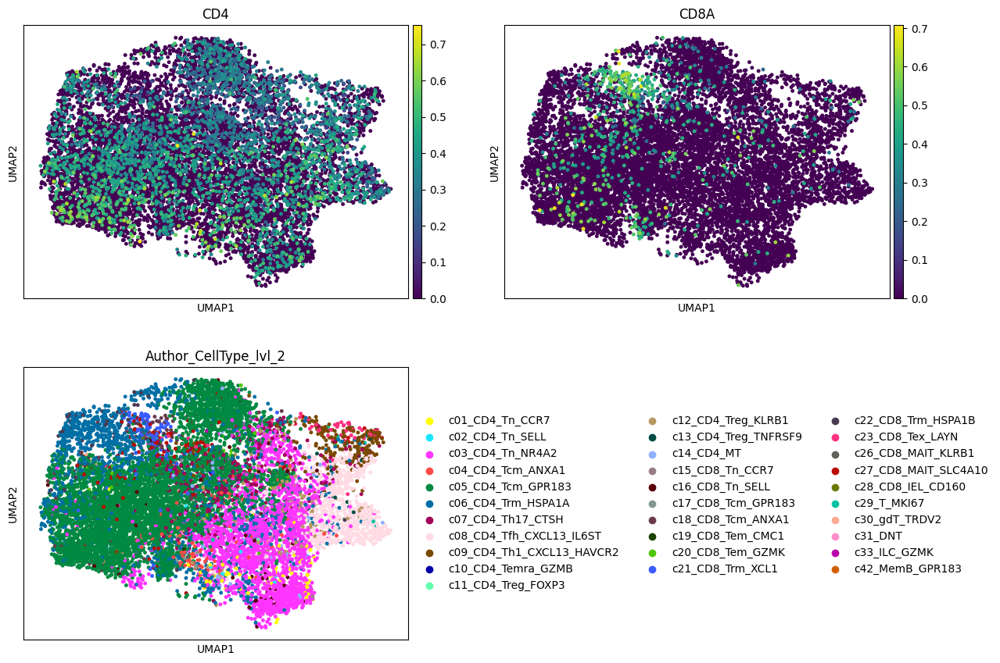

In [115]:
sc.pl.umap(adata_chen_TME_T_NK_l0_other, color=['CD4', 'CD8A', 'Author_CellType_lvl_2'], ncols=2, s=50)

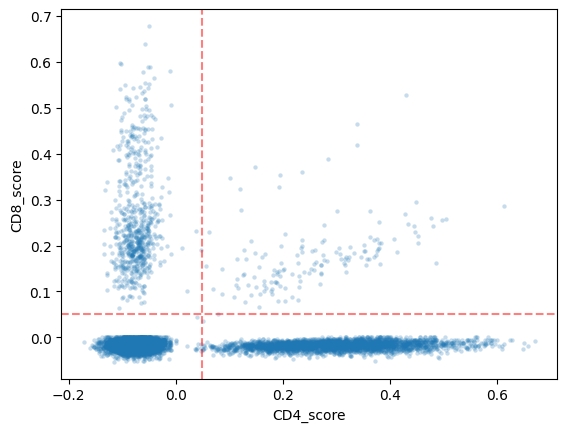

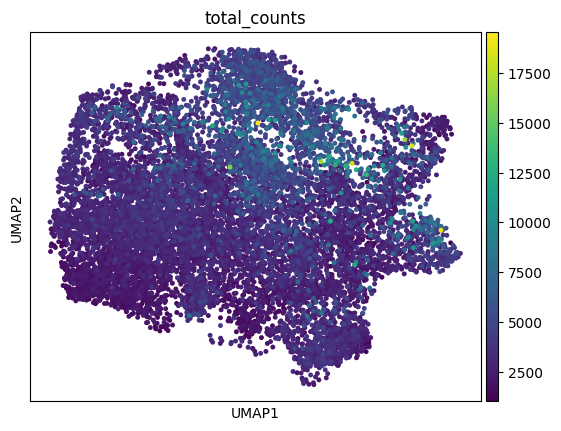

In [124]:
sns.scatterplot(data=adata_chen_TME_T_NK_l0_other.obs ,x="CD4_score", y='CD8_score', s=10, **{'linewidth':0}, alpha=0.25,)
plt.axhline(0.05, ls='--', color='red', alpha=0.5,)
plt.axvline(0.05, ls='--', color='red', alpha=0.5,)

score_threshold = 0.05

l = list()
for tup in adata_chen_TME_T_NK_l0_other.obs.itertuples():
    if (tup.CD4_score >= score_threshold) and (tup.CD8_score < score_threshold) : l.append( 'CD4+ T' )
    elif (tup.CD8_score >= score_threshold) and (tup.CD4_score < score_threshold) : l.append( 'CD8+ T' )
    elif (tup.CD8_score >= score_threshold) and (tup.CD4_score >= score_threshold) : l.append( 'DP T' )
    else: l.append( 'DN T' )

adata_chen_TME_T_NK_l0_other.obs['scatter_annot'] = l
sc.pl.umap(adata_chen_TME_T_NK_l0_other, color=['total_counts'], s=50)

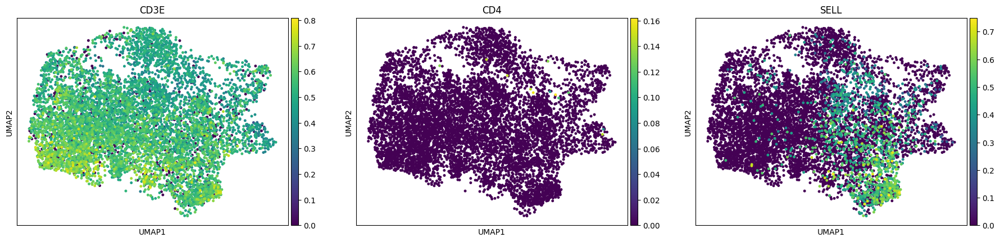

In [196]:
sc.pl.umap(adata_chen_TME_T_NK_l0_other[adata_chen_TME_T_NK_l0_other.obs['scatter_annot']=='DN T'], color=['CD3E', 'CD4', 'SELL'], s=50)

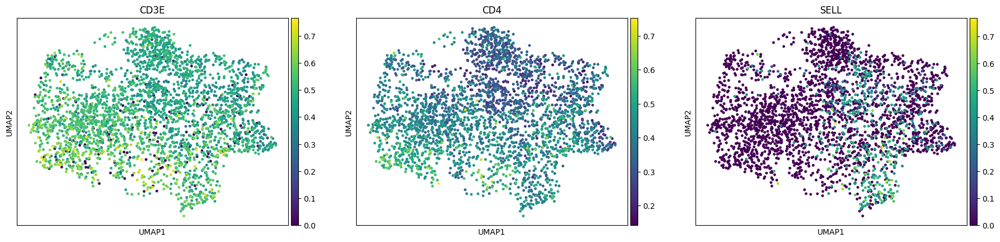

In [195]:
sc.pl.umap(adata_chen_TME_T_NK_l0_other[adata_chen_TME_T_NK_l0_other.obs['scatter_annot']=='CD4+ T'], color=['CD3E', 'CD4', 'SELL'], s=50)

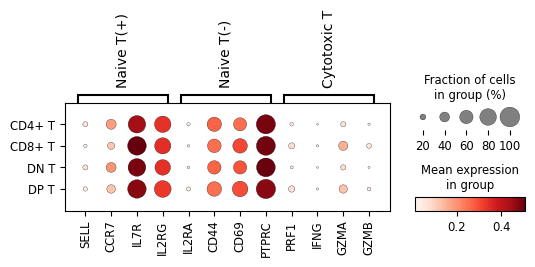

In [179]:
sc.pl.dotplot(adata_chen_TME_T_NK_l0_other, groupby='scatter_annot', var_names={'Naive T(+)' : ['SELL', 'CCR7', 'IL7R', 'IL2RG'], 
                                                                                'Naive T(-)': ['IL2RA', 'CD44', 'CD69', 'PTPRC'],
                                                                                'Cytotoxic T' : ['PRF1', 'IFNG', 'GZMA', 'GZMB'],}, )

### leiden 1, 2, 5 → CD8+ T

In [487]:
for tup in adata_chen_TME_T_NK[adata_chen_TME_T_NK.obs['sub1_leiden'].isin(['1', '2', '5'])].obs.itertuples():
    dict_Identifier_to_lvl_1_CellType[tup.Identifier] = 'T'
    dict_Identifier_to_lvl_2_CellType[tup.Identifier] = 'CD8+ T'

### leiden 3 → CD4+ T

In [488]:
for tup in adata_chen_TME_T_NK[adata_chen_TME_T_NK.obs['sub1_leiden'].isin(['3'])].obs.itertuples():
    dict_Identifier_to_lvl_1_CellType[tup.Identifier] = 'T'
    dict_Identifier_to_lvl_2_CellType[tup.Identifier] = 'CD4+ T'

### leiden 4 → Mixture of CD8+ T and GD T

In [489]:
adata_chen_TME_T_NK_l4 = adata_chen_TME_T_NK[adata_chen_TME_T_NK.obs['sub1_leiden']=='4'].copy()
adata_chen_TME_T_NK_l4 = adata_chen_TME_T_NK_l4.raw.to_adata()

temp = list()
for SampleID, edf in adata_chen_TME_T_NK_l4.obs.groupby('SampleID'):
    if len(edf) <= 1:
        temp.append( SampleID )
        dict_Identifier_to_lvl_1_CellType[edf.iloc[0].Identifier] = 'T'
        dict_Identifier_to_lvl_2_CellType[edf.iloc[0].Identifier] = 'N/A'

adata_chen_TME_T_NK_l4 = adata_chen_TME_T_NK_l4[~(adata_chen_TME_T_NK_l4.obs['SampleID'].isin(temp))].copy()

sc.pp.normalize_total(adata_chen_TME_T_NK_l4)
sc.pp.log1p(adata_chen_TME_T_NK_l4)
sc.pp.highly_variable_genes(adata_chen_TME_T_NK_l4, n_top_genes=1000, batch_key='SampleID')

adata_chen_TME_T_NK_l4.raw = adata_chen_TME_T_NK_l4.copy()
adata_chen_TME_T_NK_l4 = adata_chen_TME_T_NK_l4[:, adata_chen_TME_T_NK_l4.var.highly_variable]

sc.pp.scale(adata_chen_TME_T_NK_l4, max_value=10)
sc.tl.pca(adata_chen_TME_T_NK_l4, svd_solver="arpack")

/tmp/ipykernel_209065/1237058281.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for SampleID, edf in adata_chen_TME_T_NK_l4.obs.groupby('SampleID'):


/home/18parkky/anaconda3-2021.11/envs/sc/lib/python3.12/site-packages/scanpy/preprocessing/_scale.py:316: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [490]:
sc.pp.neighbors(adata_chen_TME_T_NK_l4, n_neighbors=5, n_pcs=40)
sc.tl.umap(adata_chen_TME_T_NK_l4, random_state=42)
sc.tl.leiden(adata_chen_TME_T_NK_l4, resolution=0.5, key_added='sub2_leiden')

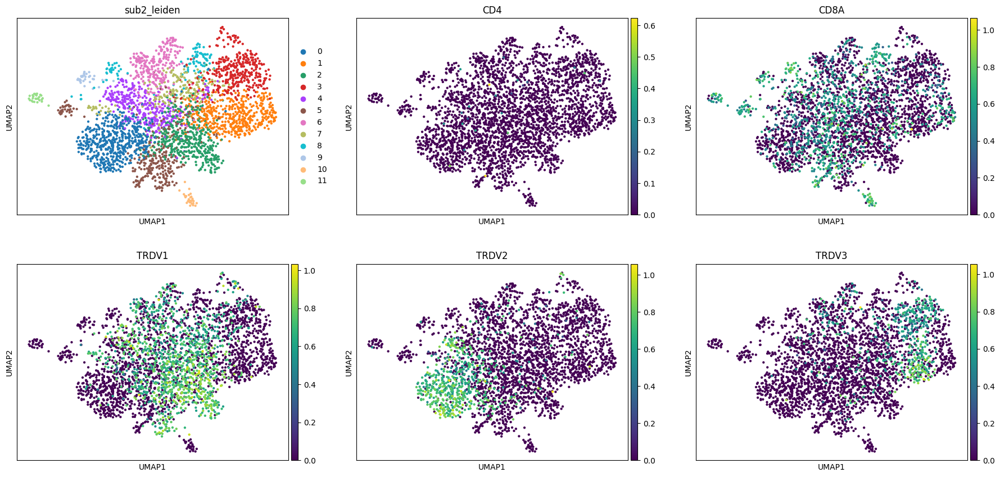

In [491]:
sc.pl.umap(adata_chen_TME_T_NK_l4, color=['sub2_leiden', 'CD4', 'CD8A', 'TRDV1', 'TRDV2', 'TRDV3'], ncols=3)

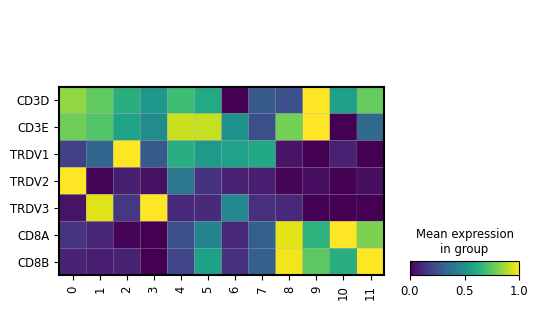

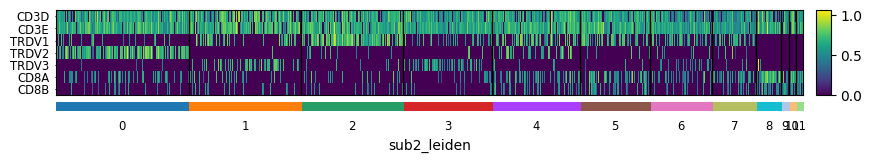

In [492]:
sc.pl.matrixplot( adata_chen_TME_T_NK_l4, groupby='sub2_leiden', var_names=['CD3D', 'CD3E', 'TRDV1', 'TRDV2', 'TRDV3', 'CD8A', 'CD8B',], swap_axes=True, standard_scale='var')
sc.pl.heatmap( adata_chen_TME_T_NK_l4, groupby='sub2_leiden', var_names=['CD3D', 'CD3E', 'TRDV1', 'TRDV2', 'TRDV3', 'CD8A', 'CD8B',], swap_axes=True, )

#### leiden 4-0 : Vδ2

In [493]:
for tup in adata_chen_TME_T_NK_l4[adata_chen_TME_T_NK_l4.obs['sub2_leiden'].isin(['0'])].obs.itertuples():
    dict_Identifier_to_lvl_1_CellType[tup.Identifier] = 'T'
    dict_Identifier_to_lvl_2_CellType[tup.Identifier] = 'Vδ2+ T'

#### leiden 4-1 : Mixture of CD8+ T, Vδ1 and Vδ3

/tmp/ipykernel_209065/3550065797.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for SampleID, edf in adata_chen_TME_T_NK_l4_l1.obs.groupby('SampleID'):
/home/18parkky/anaconda3-2021.11/envs/sc/lib/python3.12/site-packages/scanpy/preprocessing/_scale.py:316: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


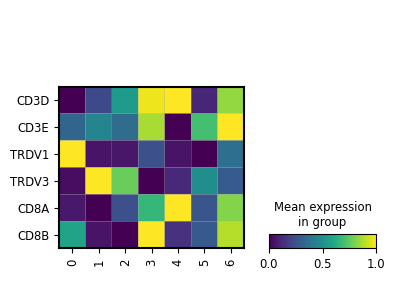

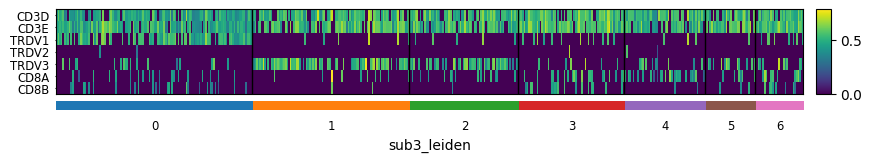

In [494]:
adata_chen_TME_T_NK_l4_l1 = adata_chen_TME_T_NK_l4[adata_chen_TME_T_NK_l4.obs['sub2_leiden']=='1'].copy()
adata_chen_TME_T_NK_l4_l1 = adata_chen_TME_T_NK_l4_l1.raw.to_adata()

temp = list()
for SampleID, edf in adata_chen_TME_T_NK_l4_l1.obs.groupby('SampleID'):
    if len(edf) <= 1:
        temp.append( SampleID )
        dict_Identifier_to_lvl_1_CellType[edf.iloc[0].Identifier] = 'T'
        dict_Identifier_to_lvl_2_CellType[edf.iloc[0].Identifier] = 'N/A'
adata_chen_TME_T_NK_l4_l1 = adata_chen_TME_T_NK_l4_l1[~(adata_chen_TME_T_NK_l4_l1.obs['SampleID'].isin(temp))].copy()

sc.pp.normalize_total(adata_chen_TME_T_NK_l4_l1)
sc.pp.log1p(adata_chen_TME_T_NK_l4_l1)
sc.pp.highly_variable_genes(adata_chen_TME_T_NK_l4_l1, n_top_genes=500, batch_key='SampleID')

adata_chen_TME_T_NK_l4_l1.raw = adata_chen_TME_T_NK_l4_l1.copy()
adata_chen_TME_T_NK_l4_l1 = adata_chen_TME_T_NK_l4_l1[:, adata_chen_TME_T_NK_l4_l1.var.highly_variable]

sc.pp.scale(adata_chen_TME_T_NK_l4_l1, max_value=10)
sc.tl.pca(adata_chen_TME_T_NK_l4_l1, svd_solver="arpack")
sc.pp.neighbors(adata_chen_TME_T_NK_l4_l1, n_neighbors=10, n_pcs=40)
sc.tl.umap(adata_chen_TME_T_NK_l4_l1, random_state=42)

sc.tl.leiden(adata_chen_TME_T_NK_l4_l1, resolution=1.0, key_added='sub3_leiden')
sc.pl.matrixplot(adata_chen_TME_T_NK_l4_l1, var_names=['CD3D', 'CD3E', 'TRDV1', 'TRDV3', 'CD8A', 'CD8B',], groupby='sub3_leiden', standard_scale='var', swap_axes=True)
sc.pl.heatmap(adata_chen_TME_T_NK_l4_l1, var_names=['CD3D', 'CD3E', 'TRDV1', 'TRDV2', 'TRDV3', 'CD8A', 'CD8B',], groupby='sub3_leiden', swap_axes=True)

In [495]:
for tup in adata_chen_TME_T_NK_l4_l1[adata_chen_TME_T_NK_l4_l1.obs['sub3_leiden'].isin(['0'])].obs.itertuples():
    dict_Identifier_to_lvl_1_CellType[tup.Identifier] = 'T'
    dict_Identifier_to_lvl_2_CellType[tup.Identifier] = 'Vδ1+ T'
    
for tup in adata_chen_TME_T_NK_l4_l1[adata_chen_TME_T_NK_l4_l1.obs['sub3_leiden'].isin(['1', '2'])].obs.itertuples():
    dict_Identifier_to_lvl_1_CellType[tup.Identifier] = 'T'
    dict_Identifier_to_lvl_2_CellType[tup.Identifier] = 'Vδ3+ T'
    
for tup in adata_chen_TME_T_NK_l4_l1[adata_chen_TME_T_NK_l4_l1.obs['sub3_leiden'].isin(['3', '4', '5', '6'])].obs.itertuples():
    dict_Identifier_to_lvl_1_CellType[tup.Identifier] = 'T'
    dict_Identifier_to_lvl_2_CellType[tup.Identifier] = 'CD8+ T'

#### leiden 4-2 : Vδ1

In [496]:
for tup in adata_chen_TME_T_NK_l4[adata_chen_TME_T_NK_l4.obs['sub2_leiden'].isin(['2'])].obs.itertuples():
    dict_Identifier_to_lvl_1_CellType[tup.Identifier] = 'T'
    dict_Identifier_to_lvl_2_CellType[tup.Identifier] = 'Vδ1+ T'

#### leiden 4-3 : Vδ3

In [497]:
for tup in adata_chen_TME_T_NK_l4[adata_chen_TME_T_NK_l4.obs['sub2_leiden'].isin(['3'])].obs.itertuples():
    dict_Identifier_to_lvl_1_CellType[tup.Identifier] = 'T'
    dict_Identifier_to_lvl_2_CellType[tup.Identifier] = 'Vδ3+ T'

#### leiden 4-4 : Mixture of CD8+ T, Vδ1 and Vδ2

In [498]:
adata_chen_TME_T_NK_l4_l4 = adata_chen_TME_T_NK_l4[adata_chen_TME_T_NK_l4.obs['sub2_leiden']=='4'].copy()
adata_chen_TME_T_NK_l4_l4 = adata_chen_TME_T_NK_l4_l4.raw.to_adata()

temp = list()
for SampleID, edf in adata_chen_TME_T_NK_l4_l4.obs.groupby('SampleID'):
    if len(edf) <= 1:
        temp.append( SampleID )
        dict_Identifier_to_lvl_1_CellType[edf.iloc[0].Identifier] = 'T'
        dict_Identifier_to_lvl_2_CellType[edf.iloc[0].Identifier] = 'N/A'
adata_chen_TME_T_NK_l4_l4 = adata_chen_TME_T_NK_l4_l4[~(adata_chen_TME_T_NK_l4_l4.obs['SampleID'].isin(temp))].copy()

sc.pp.normalize_total(adata_chen_TME_T_NK_l4_l4)
sc.pp.log1p(adata_chen_TME_T_NK_l4_l4)
sc.pp.highly_variable_genes(adata_chen_TME_T_NK_l4_l4, n_top_genes=500,)

adata_chen_TME_T_NK_l4_l4.raw = adata_chen_TME_T_NK_l4_l4.copy()
adata_chen_TME_T_NK_l4_l4 = adata_chen_TME_T_NK_l4_l4[:, adata_chen_TME_T_NK_l4_l4.var.highly_variable]

sc.pp.scale(adata_chen_TME_T_NK_l4_l4, max_value=10)
sc.tl.pca(adata_chen_TME_T_NK_l4_l4, svd_solver="arpack")
sc.pp.neighbors(adata_chen_TME_T_NK_l4_l4, n_neighbors=20, n_pcs=40)
sc.tl.umap(adata_chen_TME_T_NK_l4_l4, random_state=42)

/tmp/ipykernel_209065/959054066.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for SampleID, edf in adata_chen_TME_T_NK_l4_l4.obs.groupby('SampleID'):
/home/18parkky/anaconda3-2021.11/envs/sc/lib/python3.12/site-packages/scanpy/preprocessing/_scale.py:316: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


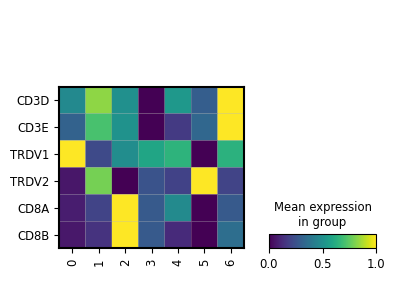

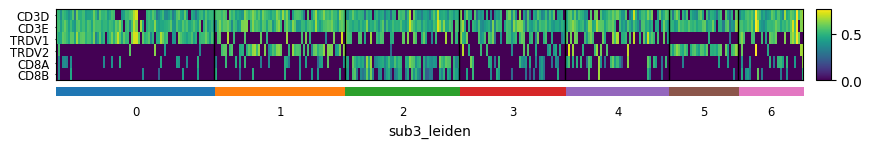

In [499]:
sc.tl.leiden(adata_chen_TME_T_NK_l4_l4, resolution=1, key_added='sub3_leiden')
sc.pl.matrixplot(adata_chen_TME_T_NK_l4_l4, var_names=['CD3D', 'CD3E', 'TRDV1', 'TRDV2', 'CD8A', 'CD8B',], groupby='sub3_leiden', standard_scale='var', swap_axes=True)
sc.pl.heatmap(adata_chen_TME_T_NK_l4_l4, var_names=['CD3D', 'CD3E', 'TRDV1', 'TRDV2', 'CD8A', 'CD8B',], groupby='sub3_leiden', swap_axes=True)

In [500]:
for tup in adata_chen_TME_T_NK_l4_l4[adata_chen_TME_T_NK_l4_l4.obs['sub3_leiden'].isin(['0', ])].obs.itertuples():
    dict_Identifier_to_lvl_1_CellType[tup.Identifier] = 'T'
    dict_Identifier_to_lvl_2_CellType[tup.Identifier] = 'Vδ1+ T'
    
for tup in adata_chen_TME_T_NK_l4_l4[adata_chen_TME_T_NK_l4_l4.obs['sub3_leiden'].isin(['1', '5'])].obs.itertuples():
    dict_Identifier_to_lvl_1_CellType[tup.Identifier] = 'T'
    dict_Identifier_to_lvl_2_CellType[tup.Identifier] = 'Vδ2+ T'
    
for tup in adata_chen_TME_T_NK_l4_l4[adata_chen_TME_T_NK_l4_l4.obs['sub3_leiden'].isin(['2'])].obs.itertuples():
    dict_Identifier_to_lvl_1_CellType[tup.Identifier] = 'T'
    dict_Identifier_to_lvl_2_CellType[tup.Identifier] = 'CD8+ T'
    
for tup in adata_chen_TME_T_NK_l4_l4[adata_chen_TME_T_NK_l4_l4.obs['sub3_leiden'].isin(['3', '4', '6'])].obs.itertuples():
    dict_Identifier_to_lvl_1_CellType[tup.Identifier] = 'T'
    dict_Identifier_to_lvl_2_CellType[tup.Identifier] = 'N/A'

#### leiden 4-6 : Mixture of CD8+ T, Vδ1 and Vδ3

In [501]:
adata_chen_TME_T_NK_l4_l6 = adata_chen_TME_T_NK_l4[adata_chen_TME_T_NK_l4.obs['sub2_leiden']=='6'].copy()
adata_chen_TME_T_NK_l4_l6 = adata_chen_TME_T_NK_l4_l6.raw.to_adata()

temp = list()
for SampleID, edf in adata_chen_TME_T_NK_l4_l6.obs.groupby('SampleID'):
    if len(edf) <= 1:
        temp.append( SampleID )
        dict_Identifier_to_lvl_1_CellType[edf.iloc[0].Identifier] = 'T'
        dict_Identifier_to_lvl_2_CellType[edf.iloc[0].Identifier] = 'N/A'
adata_chen_TME_T_NK_l4_l6 = adata_chen_TME_T_NK_l4_l6[~(adata_chen_TME_T_NK_l4_l6.obs['SampleID'].isin(temp))].copy()

sc.pp.normalize_total(adata_chen_TME_T_NK_l4_l6)
sc.pp.log1p(adata_chen_TME_T_NK_l4_l6)
sc.pp.highly_variable_genes(adata_chen_TME_T_NK_l4_l6, n_top_genes=500,)

adata_chen_TME_T_NK_l4_l6.raw = adata_chen_TME_T_NK_l4_l6.copy()
adata_chen_TME_T_NK_l4_l6 = adata_chen_TME_T_NK_l4_l6[:, adata_chen_TME_T_NK_l4_l6.var.highly_variable]

sc.pp.scale(adata_chen_TME_T_NK_l4_l6, max_value=10)
sc.tl.pca(adata_chen_TME_T_NK_l4_l6, svd_solver="arpack")
sc.pp.neighbors(adata_chen_TME_T_NK_l4_l6, n_neighbors=5, n_pcs=40)
sc.tl.umap(adata_chen_TME_T_NK_l4_l6, random_state=42)

/tmp/ipykernel_209065/1843128877.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for SampleID, edf in adata_chen_TME_T_NK_l4_l6.obs.groupby('SampleID'):
/home/18parkky/anaconda3-2021.11/envs/sc/lib/python3.12/site-packages/scanpy/preprocessing/_scale.py:316: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


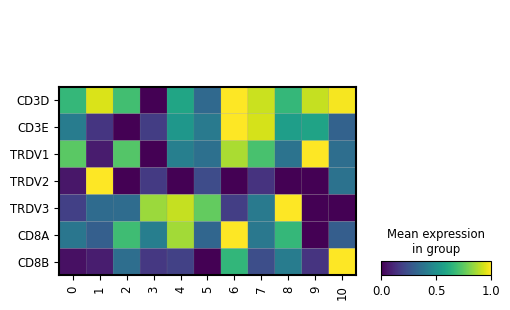

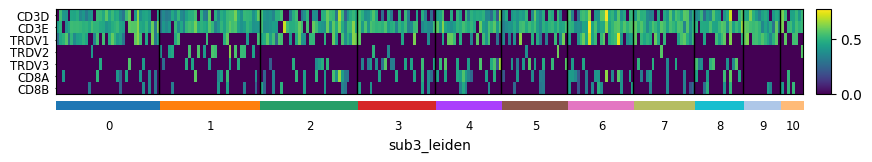

In [502]:
sc.tl.leiden(adata_chen_TME_T_NK_l4_l6, resolution=1.2, key_added='sub3_leiden')
sc.pl.matrixplot(adata_chen_TME_T_NK_l4_l6, var_names=['CD3D', 'CD3E', 'TRDV1', 'TRDV2', 'TRDV3', 'CD8A', 'CD8B',], groupby='sub3_leiden', standard_scale='var', swap_axes=True)
sc.pl.heatmap(adata_chen_TME_T_NK_l4_l6, var_names=['CD3D', 'CD3E', 'TRDV1', 'TRDV2', 'TRDV3', 'CD8A', 'CD8B',], groupby='sub3_leiden', swap_axes=True)

In [503]:
for tup in adata_chen_TME_T_NK_l4_l6[adata_chen_TME_T_NK_l4_l6.obs['sub3_leiden'].isin(['0', '2', '6', '7', '9'])].obs.itertuples():
    dict_Identifier_to_lvl_1_CellType[tup.Identifier] = 'T'
    dict_Identifier_to_lvl_2_CellType[tup.Identifier] = 'Vδ1+ T'
    
for tup in adata_chen_TME_T_NK_l4_l6[adata_chen_TME_T_NK_l4_l6.obs['sub3_leiden'].isin(['3'])].obs.itertuples():
    dict_Identifier_to_lvl_1_CellType[tup.Identifier] = 'T'
    dict_Identifier_to_lvl_2_CellType[tup.Identifier] = 'Vδ3+ T'
    
for tup in adata_chen_TME_T_NK_l4_l6[adata_chen_TME_T_NK_l4_l6.obs['sub3_leiden'].isin(['1', '4', '5', '8', '10'])].obs.itertuples():
    dict_Identifier_to_lvl_1_CellType[tup.Identifier] = 'T'
    dict_Identifier_to_lvl_2_CellType[tup.Identifier] = 'N/A'

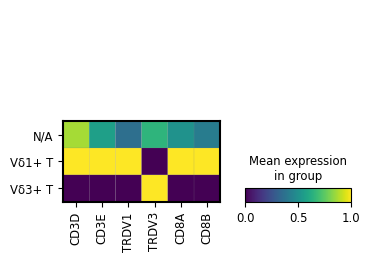

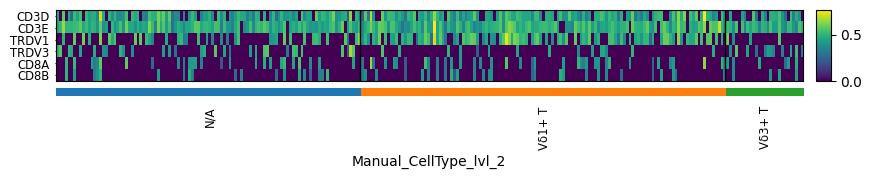

In [504]:
adata_chen_TME_T_NK_l4_l6.obs['Manual_CellType_lvl_2'] = [ dict_Identifier_to_lvl_2_CellType[Identifier] for Identifier in adata_chen_TME_T_NK_l4_l6.obs['Identifier'] ]

sc.pl.matrixplot(adata_chen_TME_T_NK_l4_l6, var_names=['CD3D', 'CD3E', 'TRDV1', 'TRDV3', 'CD8A', 'CD8B',], groupby='Manual_CellType_lvl_2', swap_axes=False, standard_scale='var', )
sc.pl.heatmap(adata_chen_TME_T_NK_l4_l6, var_names=['CD3D', 'CD3E', 'TRDV1', 'TRDV3', 'CD8A', 'CD8B',], groupby='Manual_CellType_lvl_2', swap_axes=True, )

#### leiden 4-5,7,8,9,10,11 : CD8

In [505]:
for tup in adata_chen_TME_T_NK_l4[adata_chen_TME_T_NK_l4.obs['sub2_leiden'].isin(['5', '7', '8', '9', '10', '11'])].obs.itertuples():
    dict_Identifier_to_lvl_1_CellType[tup.Identifier] = 'T'
    dict_Identifier_to_lvl_2_CellType[tup.Identifier] = 'CD8+ T'

#### Inspect results

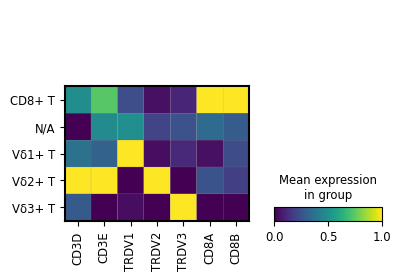

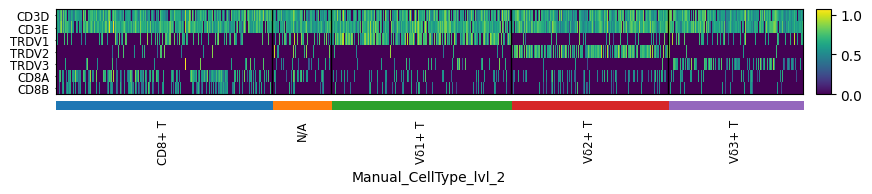

In [506]:
adata_chen_TME_T_NK_l4.obs['Manual_CellType_lvl_2'] = [ dict_Identifier_to_lvl_2_CellType[Identifier] for Identifier in adata_chen_TME_T_NK_l4.obs['Identifier'] ]
sc.pl.matrixplot(adata_chen_TME_T_NK_l4, var_names=['CD3D', 'CD3E', 'TRDV1', 'TRDV2', 'TRDV3', 'CD8A', 'CD8B',], groupby='Manual_CellType_lvl_2', standard_scale='var', swap_axes=False)
sc.pl.heatmap(adata_chen_TME_T_NK_l4, var_names=['CD3D', 'CD3E', 'TRDV1', 'TRDV2', 'TRDV3', 'CD8A', 'CD8B',], groupby='Manual_CellType_lvl_2', swap_axes=True)

### leiden 6-8 

In [507]:
adata_chen_TME_T_NK_l6 = adata_chen_TME_T_NK[adata_chen_TME_T_NK.obs['sub1_leiden'].isin(['6', '7', '8'])]
adata_chen_TME_T_NK_l6 = adata_chen_TME_T_NK_l6.raw.to_adata()

temp = list()
for SampleID, edf in adata_chen_TME_T_NK_l6.obs.groupby('SampleID'):
    if len(edf) <= 1:
        temp.append( SampleID )
        dict_Identifier_to_lvl_1_CellType[edf.iloc[0].Identifier] = 'N/A'
        dict_Identifier_to_lvl_2_CellType[edf.iloc[0].Identifier] = 'N/A'

adata_chen_TME_T_NK_l6 = adata_chen_TME_T_NK_l6[~(adata_chen_TME_T_NK_l6.obs['SampleID'].isin(temp))].copy()

sc.pp.normalize_total(adata_chen_TME_T_NK_l6)
sc.pp.log1p(adata_chen_TME_T_NK_l6)
sc.pp.highly_variable_genes(adata_chen_TME_T_NK_l6, n_top_genes=2000, batch_key='SampleID')

adata_chen_TME_T_NK_l6.raw = adata_chen_TME_T_NK_l6.copy()
adata_chen_TME_T_NK_l6 = adata_chen_TME_T_NK_l6[:, adata_chen_TME_T_NK_l6.var.highly_variable]

sc.pp.scale(adata_chen_TME_T_NK_l6, max_value=10)
sc.tl.pca(adata_chen_TME_T_NK_l6, svd_solver="arpack")

sc.pp.neighbors(adata_chen_TME_T_NK_l6, n_neighbors=10, n_pcs=40)
sc.tl.umap(adata_chen_TME_T_NK_l6, random_state=24)
sc.tl.leiden(adata_chen_TME_T_NK_l6, resolution=0.3, key_added='sub2_leiden')

/tmp/ipykernel_209065/1628993217.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for SampleID, edf in adata_chen_TME_T_NK_l6.obs.groupby('SampleID'):
/home/18parkky/anaconda3-2021.11/envs/sc/lib/python3.12/site-packages/scanpy/preprocessing/_scale.py:316: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


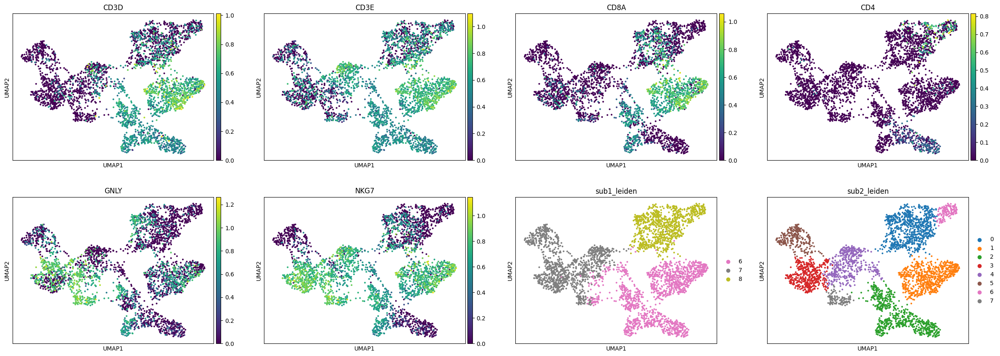

In [508]:
sc.pl.umap(adata_chen_TME_T_NK_l6, color=['CD3D', 'CD3E', 'CD8A', 'CD4', 
                                          "GNLY", "NKG7", 'sub1_leiden', 'sub2_leiden'], ncols=4)

#### leiden [6-8]-0 → Mixture of CD4+ T and CD8+ T

/tmp/ipykernel_209065/3463851463.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for SampleID, edf in adata_chen_TME_T_NK_l6_l0.obs.groupby('SampleID'):
/home/18parkky/anaconda3-2021.11/envs/sc/lib/python3.12/site-packages/scanpy/preprocessing/_highly_variable_genes.py:412: UserWarning: `n_top_genes` > number of normalized dispersions, returning all genes with normalized dispersions.
  warnings.warn(msg, UserWarning)
/home/18parkky/anaconda3-2021.11/envs/sc/lib/python3.12/site-packages/scanpy/preprocessing/_scale.py:316: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


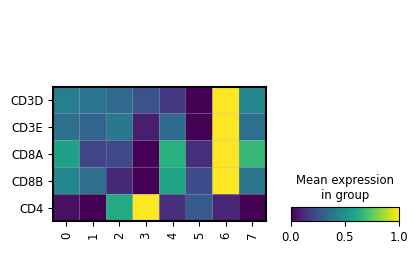

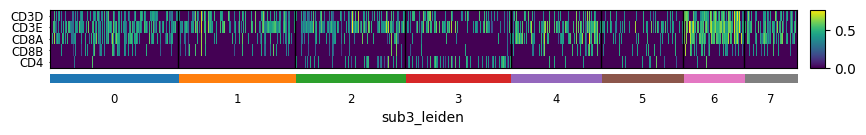

In [509]:
adata_chen_TME_T_NK_l6_l0 = adata_chen_TME_T_NK_l6[adata_chen_TME_T_NK_l6.obs['sub2_leiden']=='0'].copy()
adata_chen_TME_T_NK_l6_l0 = adata_chen_TME_T_NK_l6_l0.raw.to_adata()

temp = list()
for SampleID, edf in adata_chen_TME_T_NK_l6_l0.obs.groupby('SampleID'):
    if len(edf) <= 1:
        temp.append( SampleID )
        dict_Identifier_to_lvl_1_CellType[edf.iloc[0].Identifier] = 'T'
        dict_Identifier_to_lvl_2_CellType[edf.iloc[0].Identifier] = 'N/A'
adata_chen_TME_T_NK_l6_l0 = adata_chen_TME_T_NK_l6_l0[~(adata_chen_TME_T_NK_l6_l0.obs['SampleID'].isin(temp))].copy()

sc.pp.normalize_total(adata_chen_TME_T_NK_l6_l0)
sc.pp.log1p(adata_chen_TME_T_NK_l6_l0)
sc.pp.highly_variable_genes(adata_chen_TME_T_NK_l6_l0, n_top_genes=2000, batch_key='SampleID')

adata_chen_TME_T_NK_l6_l0.raw = adata_chen_TME_T_NK_l6_l0.copy()
adata_chen_TME_T_NK_l6_l0 = adata_chen_TME_T_NK_l6_l0[:, adata_chen_TME_T_NK_l6_l0.var.highly_variable]

sc.pp.scale(adata_chen_TME_T_NK_l6_l0, max_value=10)
sc.tl.pca(adata_chen_TME_T_NK_l6_l0, svd_solver="arpack")
sc.pp.neighbors(adata_chen_TME_T_NK_l6_l0, n_neighbors=15, n_pcs=40)
sc.tl.umap(adata_chen_TME_T_NK_l6_l0, random_state=42)

sc.tl.leiden(adata_chen_TME_T_NK_l6_l0, resolution=1.0, key_added='sub3_leiden')
sc.pl.matrixplot(adata_chen_TME_T_NK_l6_l0, var_names=['CD3D', 'CD3E', 'CD8A', 'CD8B', 'CD4'], groupby='sub3_leiden', standard_scale='var', swap_axes=True)
sc.pl.heatmap(adata_chen_TME_T_NK_l6_l0, var_names=['CD3D', 'CD3E', 'CD8A', 'CD8B',  'CD4'], groupby='sub3_leiden', swap_axes=True)

In [510]:
for tup in adata_chen_TME_T_NK_l6_l0[adata_chen_TME_T_NK_l6_l0.obs['sub3_leiden'].isin(['0','4', '6', '7'])].obs.itertuples():
    dict_Identifier_to_lvl_1_CellType[tup.Identifier] = 'T'
    dict_Identifier_to_lvl_2_CellType[tup.Identifier] = 'CD8+ T'
    
for tup in adata_chen_TME_T_NK_l6_l0[adata_chen_TME_T_NK_l6_l0.obs['sub3_leiden'].isin(['2', '3'])].obs.itertuples():
    dict_Identifier_to_lvl_1_CellType[tup.Identifier] = 'T'
    dict_Identifier_to_lvl_2_CellType[tup.Identifier] = 'CD4+ T'
    
for tup in adata_chen_TME_T_NK_l6_l0[adata_chen_TME_T_NK_l6_l0.obs['sub3_leiden'].isin(['1', '5'])].obs.itertuples():
    dict_Identifier_to_lvl_1_CellType[tup.Identifier] = 'T'
    dict_Identifier_to_lvl_2_CellType[tup.Identifier] = 'N/A'

#### leiden [6-8]-1 → CD8+ T

In [511]:
for tup in adata_chen_TME_T_NK_l6[adata_chen_TME_T_NK_l6.obs['sub2_leiden']=='1'].obs.itertuples():
    dict_Identifier_to_lvl_1_CellType[tup.Identifier] = 'T'
    dict_Identifier_to_lvl_2_CellType[tup.Identifier] = 'CD8+ T'

#### leiden [6-8]-2 → Mixture of CD4+ T and CD8+ T

/tmp/ipykernel_209065/1853462931.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for SampleID, edf in adata_chen_TME_T_NK_l6_l2.obs.groupby('SampleID'):
/home/18parkky/anaconda3-2021.11/envs/sc/lib/python3.12/site-packages/scanpy/preprocessing/_scale.py:316: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


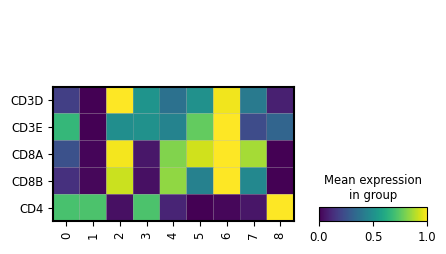

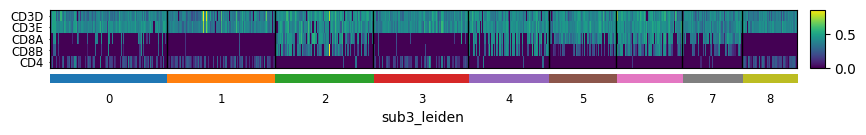

In [512]:
adata_chen_TME_T_NK_l6_l2 = adata_chen_TME_T_NK_l6[adata_chen_TME_T_NK_l6.obs['sub2_leiden']=='2'].copy()
adata_chen_TME_T_NK_l6_l2 = adata_chen_TME_T_NK_l6_l2.raw.to_adata()

temp = list()
for SampleID, edf in adata_chen_TME_T_NK_l6_l2.obs.groupby('SampleID'):
    if len(edf) <= 1:
        temp.append( SampleID )
        dict_Identifier_to_lvl_1_CellType[edf.iloc[0].Identifier] = 'T'
        dict_Identifier_to_lvl_2_CellType[edf.iloc[0].Identifier] = 'N/A'
adata_chen_TME_T_NK_l6_l2 = adata_chen_TME_T_NK_l6_l2[~(adata_chen_TME_T_NK_l6_l2.obs['SampleID'].isin(temp))].copy()

sc.pp.normalize_total(adata_chen_TME_T_NK_l6_l2)
sc.pp.log1p(adata_chen_TME_T_NK_l6_l2)
sc.pp.highly_variable_genes(adata_chen_TME_T_NK_l6_l2, n_top_genes=2000, batch_key='SampleID')

adata_chen_TME_T_NK_l6_l2.raw = adata_chen_TME_T_NK_l6_l2.copy()
adata_chen_TME_T_NK_l6_l2 = adata_chen_TME_T_NK_l6_l2[:, adata_chen_TME_T_NK_l6_l2.var.highly_variable]

sc.pp.scale(adata_chen_TME_T_NK_l6_l2, max_value=10)
sc.tl.pca(adata_chen_TME_T_NK_l6_l2, svd_solver="arpack")
sc.pp.neighbors(adata_chen_TME_T_NK_l6_l2, n_neighbors=15, n_pcs=40)
sc.tl.umap(adata_chen_TME_T_NK_l6_l2, random_state=42)

sc.tl.leiden(adata_chen_TME_T_NK_l6_l2, resolution=1.0, key_added='sub3_leiden')
sc.pl.matrixplot(adata_chen_TME_T_NK_l6_l2, var_names=['CD3D', 'CD3E', 'CD8A', 'CD8B', 'CD4'], groupby='sub3_leiden', standard_scale='var', swap_axes=True)
sc.pl.heatmap(adata_chen_TME_T_NK_l6_l2, var_names=['CD3D', 'CD3E', 'CD8A', 'CD8B',  'CD4'], groupby='sub3_leiden', swap_axes=True)

In [513]:
for tup in adata_chen_TME_T_NK_l6_l2[adata_chen_TME_T_NK_l6_l2.obs['sub3_leiden'].isin(['0', '1', '3', '8'])].obs.itertuples():
    dict_Identifier_to_lvl_1_CellType[tup.Identifier] = 'T'
    dict_Identifier_to_lvl_2_CellType[tup.Identifier] = 'CD4+ T'
    
for tup in adata_chen_TME_T_NK_l6_l2[adata_chen_TME_T_NK_l6_l2.obs['sub3_leiden'].isin(['2', '4', '5' , '6', '7'])].obs.itertuples():
    dict_Identifier_to_lvl_1_CellType[tup.Identifier] = 'T'
    dict_Identifier_to_lvl_2_CellType[tup.Identifier] = 'CD8+ T'

#### leiden [6-8]-3 → NK

In [514]:
for tup in adata_chen_TME_T_NK_l6[adata_chen_TME_T_NK_l6.obs['sub2_leiden']=='3'].obs.itertuples():
    dict_Identifier_to_lvl_1_CellType[tup.Identifier] = 'NK'
    dict_Identifier_to_lvl_2_CellType[tup.Identifier] = 'NK'

#### leiden [6-8]-4 → Mixture of NK and ?

/tmp/ipykernel_209065/39082365.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for SampleID, edf in adata_chen_TME_T_NK_l6_l4.obs.groupby('SampleID'):
/home/18parkky/anaconda3-2021.11/envs/sc/lib/python3.12/site-packages/scanpy/preprocessing/_highly_variable_genes.py:412: UserWarning: `n_top_genes` > number of normalized dispersions, returning all genes with normalized dispersions.
  warnings.warn(msg, UserWarning)
/home/18parkky/anaconda3-2021.11/envs/sc/lib/python3.12/site-packages/scanpy/preprocessing/_scale.py:316: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


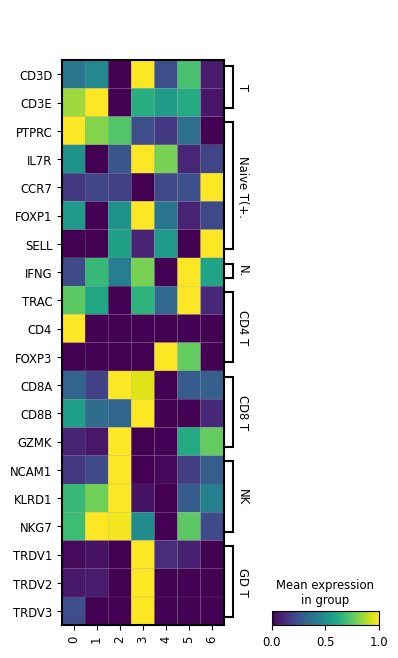

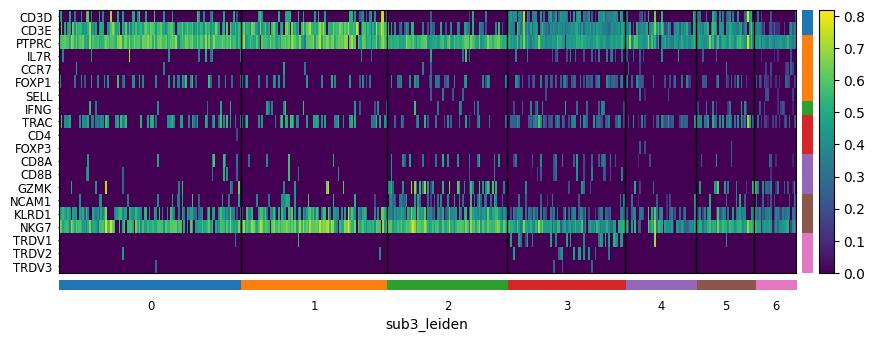

In [515]:
adata_chen_TME_T_NK_l6_l4 = adata_chen_TME_T_NK_l6[adata_chen_TME_T_NK_l6.obs['sub2_leiden']=='4'].copy()
adata_chen_TME_T_NK_l6_l4 = adata_chen_TME_T_NK_l6_l4.raw.to_adata()

temp = list()
for SampleID, edf in adata_chen_TME_T_NK_l6_l4.obs.groupby('SampleID'):
    if len(edf) <= 1:
        temp.append( SampleID )
        dict_Identifier_to_lvl_1_CellType[edf.iloc[0].Identifier] = 'T'
        dict_Identifier_to_lvl_2_CellType[edf.iloc[0].Identifier] = 'N/A'
adata_chen_TME_T_NK_l6_l4 = adata_chen_TME_T_NK_l6_l4[~(adata_chen_TME_T_NK_l6_l4.obs['SampleID'].isin(temp))].copy()

sc.pp.normalize_total(adata_chen_TME_T_NK_l6_l4)
sc.pp.log1p(adata_chen_TME_T_NK_l6_l4)
sc.pp.highly_variable_genes(adata_chen_TME_T_NK_l6_l4, n_top_genes=2000, batch_key='SampleID')

adata_chen_TME_T_NK_l6_l4.raw = adata_chen_TME_T_NK_l6_l4.copy()
adata_chen_TME_T_NK_l6_l4 = adata_chen_TME_T_NK_l6_l4[:, adata_chen_TME_T_NK_l6_l4.var.highly_variable]

sc.pp.scale(adata_chen_TME_T_NK_l6_l4, max_value=10)
sc.tl.pca(adata_chen_TME_T_NK_l6_l4, svd_solver="arpack")
sc.pp.neighbors(adata_chen_TME_T_NK_l6_l4, n_neighbors=15, n_pcs=40)
sc.tl.umap(adata_chen_TME_T_NK_l6_l4, random_state=42)

sc.tl.leiden(adata_chen_TME_T_NK_l6_l4, resolution=1.0, key_added='sub3_leiden')
sc.pl.matrixplot(adata_chen_TME_T_NK_l6_l4, var_names=T_markers, groupby='sub3_leiden', standard_scale='var', swap_axes=True)
sc.pl.heatmap(adata_chen_TME_T_NK_l6_l4, var_names=T_markers, groupby='sub3_leiden', swap_axes=True)

In [516]:
for tup in adata_chen_TME_T_NK_l6_l4[adata_chen_TME_T_NK_l6_l4.obs['sub3_leiden'].isin(['0', '1', '2', '4', '5', '6'])].obs.itertuples():
    dict_Identifier_to_lvl_1_CellType[tup.Identifier] = 'NK'
    dict_Identifier_to_lvl_2_CellType[tup.Identifier] = 'NK'
    
for tup in adata_chen_TME_T_NK_l6_l4[adata_chen_TME_T_NK_l6_l4.obs['sub3_leiden'].isin(['3'])].obs.itertuples():
    dict_Identifier_to_lvl_1_CellType[tup.Identifier] = 'T'
    dict_Identifier_to_lvl_2_CellType[tup.Identifier] = 'N/A'

#### leiden [6-8]-5 → N/A (high MT-genes, likely low-quality cells)

/tmp/ipykernel_209065/3495683328.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for SampleID, edf in adata_chen_TME_T_NK_l6_l5.obs.groupby('SampleID'):
/home/18parkky/anaconda3-2021.11/envs/sc/lib/python3.12/site-packages/scanpy/preprocessing/_highly_variable_genes.py:412: UserWarning: `n_top_genes` > number of normalized dispersions, returning all genes with normalized dispersions.
  warnings.warn(msg, UserWarning)
/home/18parkky/anaconda3-2021.11/envs/sc/lib/python3.12/site-packages/scanpy/preprocessing/_scale.py:316: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


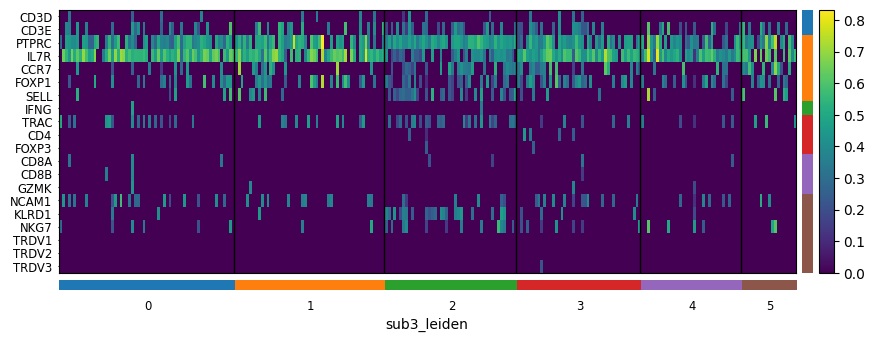

In [517]:
adata_chen_TME_T_NK_l6_l5 = adata_chen_TME_T_NK_l6[adata_chen_TME_T_NK_l6.obs['sub2_leiden']=='5'].copy()
adata_chen_TME_T_NK_l6_l5 = adata_chen_TME_T_NK_l6_l5.raw.to_adata()

temp = list()
for SampleID, edf in adata_chen_TME_T_NK_l6_l5.obs.groupby('SampleID'):
    if len(edf) <= 1:
        temp.append( SampleID )
        dict_Identifier_to_lvl_1_CellType[edf.iloc[0].Identifier] = 'T'
        dict_Identifier_to_lvl_2_CellType[edf.iloc[0].Identifier] = 'N/A'
adata_chen_TME_T_NK_l6_l5 = adata_chen_TME_T_NK_l6_l5[~(adata_chen_TME_T_NK_l6_l5.obs['SampleID'].isin(temp))].copy()

sc.pp.normalize_total(adata_chen_TME_T_NK_l6_l5)
sc.pp.log1p(adata_chen_TME_T_NK_l6_l5)
sc.pp.highly_variable_genes(adata_chen_TME_T_NK_l6_l5, n_top_genes=2000, batch_key='SampleID')

adata_chen_TME_T_NK_l6_l5.raw = adata_chen_TME_T_NK_l6_l5.copy()
adata_chen_TME_T_NK_l6_l5 = adata_chen_TME_T_NK_l6_l5[:, adata_chen_TME_T_NK_l6_l5.var.highly_variable]

sc.pp.scale(adata_chen_TME_T_NK_l6_l5, max_value=10)
sc.tl.pca(adata_chen_TME_T_NK_l6_l5, svd_solver="arpack")
sc.pp.neighbors(adata_chen_TME_T_NK_l6_l5, n_neighbors=15, n_pcs=40)
sc.tl.umap(adata_chen_TME_T_NK_l6_l5, random_state=42)

sc.tl.leiden(adata_chen_TME_T_NK_l6_l5, resolution=1.0, key_added='sub3_leiden')
sc.pl.heatmap(adata_chen_TME_T_NK_l6_l5, var_names=T_markers, groupby='sub3_leiden', swap_axes=True)

In [518]:
for tup in adata_chen_TME_T_NK_l6_l5.obs.itertuples():
    dict_Identifier_to_lvl_1_CellType[tup.Identifier] = 'N/A'
    dict_Identifier_to_lvl_2_CellType[tup.Identifier] = 'N/A'

#### leiden [6-8]-6 → CD4+ T

In [519]:
for tup in adata_chen_TME_T_NK_l6[adata_chen_TME_T_NK_l6.obs['sub2_leiden']=='6'].obs.itertuples():
    dict_Identifier_to_lvl_1_CellType[tup.Identifier] = 'T'
    dict_Identifier_to_lvl_2_CellType[tup.Identifier] = 'CD4+ T'

#### leiden [6-8]-7 → NK

In [520]:
for tup in adata_chen_TME_T_NK_l6[adata_chen_TME_T_NK_l6.obs['sub2_leiden']=='7'].obs.itertuples():
    dict_Identifier_to_lvl_1_CellType[tup.Identifier] = 'NK'
    dict_Identifier_to_lvl_2_CellType[tup.Identifier] = 'NK'

### Label results

In [521]:
adata_chen_TME_T_NK.obs['Manual_CellType_lvl_1'] = [ dict_Identifier_to_lvl_1_CellType[Identifier] for Identifier in adata_chen_TME_T_NK.obs['Identifier'] ]
adata_chen_TME_T_NK.obs['Manual_CellType_lvl_2'] = [ dict_Identifier_to_lvl_2_CellType[Identifier] for Identifier in adata_chen_TME_T_NK.obs['Identifier'] ]

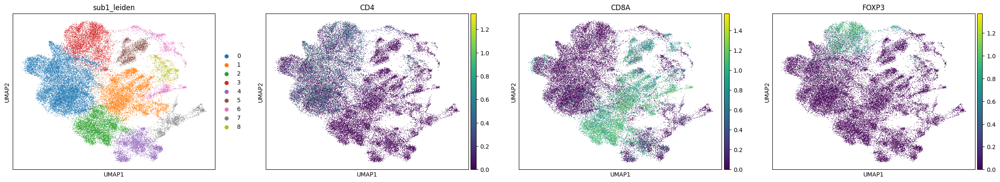

In [522]:
sc.pl.umap(adata_chen_TME_T_NK, color=['sub1_leiden', 'CD4', 'CD8A', 'FOXP3'])

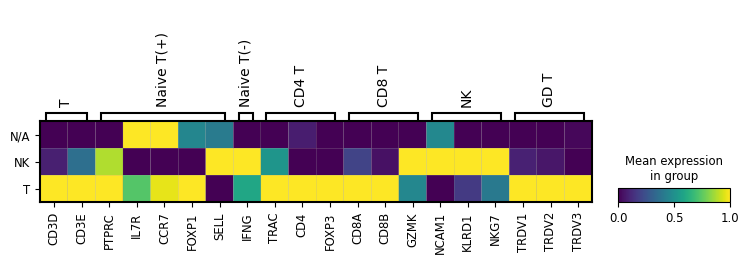

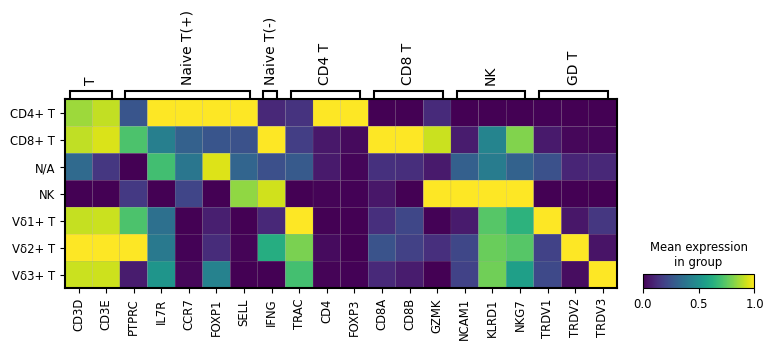

In [523]:
sc.pl.matrixplot(adata_chen_TME_T_NK, var_names=T_markers, groupby='Manual_CellType_lvl_1', standard_scale='var')
sc.pl.matrixplot(adata_chen_TME_T_NK, var_names=T_markers, groupby='Manual_CellType_lvl_2', standard_scale='var')

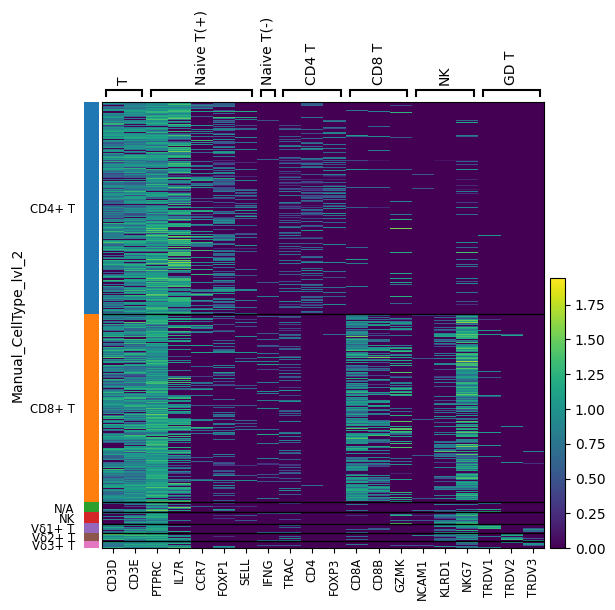

In [524]:
sc.pl.heatmap(adata_chen_TME_T_NK, var_names=T_markers, groupby='Manual_CellType_lvl_2', )

In [525]:
saveWithPickle(dict_Identifier_to_lvl_1_CellType, '/node200data/18parkky/datasets/data/public/processed_data/Immunotherapy_CRC_Chen_et_al/2_cell_type_labeled_h5ad/dict_Identifier_to_CellType', 'B_and_T.lvl1')
saveWithPickle(dict_Identifier_to_lvl_2_CellType, '/node200data/18parkky/datasets/data/public/processed_data/Immunotherapy_CRC_Chen_et_al/2_cell_type_labeled_h5ad/dict_Identifier_to_CellType', 'B_and_T.lvl2')